In [44]:
adata = sc.read_h5ad('./adata_CITE_soloTE_splice.h5ad')

In [45]:
adata

AnnData object with n_obs × n_vars = 169014 × 36601
    obs: 'date', 'souporcell_status', 'souporcell_assignment', 'demux_type', 'assignment', 'hashtag_counts', 'Demux2_assignment', 'Demux2_droplet_type', 'batch', 'prep_type', 'Demux2_plus_demuxem_assignment', 'total_counts_TDP', 'total_counts_KHSRP', 'total_counts_H3', 'total_counts_NFKB', 'total_counts_ORF1', 'total_counts_PTBP1', 'total_counts_ORF2', 'total_counts_STAT3', 'total_counts_BCATENIN', 'total_counts_HNRNPA1', 'total_counts_SRRM2', 'total_counts_MATR3', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'new_status', 'Exclusion', 'date.1', 'bank', 'region', 'Sex', 'Age', 'DiseaseState', 'SampleID', 'PostmortemInterval', 'NIHBankRIN', 'MurphyLabRIN', 'JoinedRIN', 'FACs_NeuN_Percentage', 'FACs_ErgHi_Percentage', 'FACs_ErgLo_Percentage', 'Sequence_ApoE_allele', 'Pathology_BrainWeight (g)', 'SampleID_Gel', 'Gel', 'Vcam_rel_to_Amyl_Gapdh', 'Vcam_topband', 'Vcam_65', 'Vcam_32', 'Vcam_topband_rel_to_gapdh', 'Vcam65

In [46]:
adata.var.feature_types.value_counts()

feature_types
Gene Expression    36601
Name: count, dtype: int64

In [47]:
#incite batches checks 
batch_data= adata[adata.obs['prep_type'].isin(['10x3prime_inCITE_soloTE'])]

In [52]:
batch_data.obs['n_counts'] = batch_data.X.sum(axis=1)

/tmp/ipykernel_2177617/1178978134.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  batch_data.obs['n_counts'] = batch_data.X.sum(axis=1)


In [49]:
adata.obs['total_counts_SRRM2'].describe()

count    89396.000000
mean       181.664948
std        191.005783
min          0.000000
25%         64.000000
50%        121.000000
75%        231.000000
max       4027.000000
Name: total_counts_SRRM2, dtype: float64

In [48]:
batch_data.obs['total_counts_SRRM2'].describe()

count    89396.000000
mean       181.664948
std        191.005783
min          0.000000
25%         64.000000
50%        121.000000
75%        231.000000
max       4027.000000
Name: total_counts_SRRM2, dtype: float64

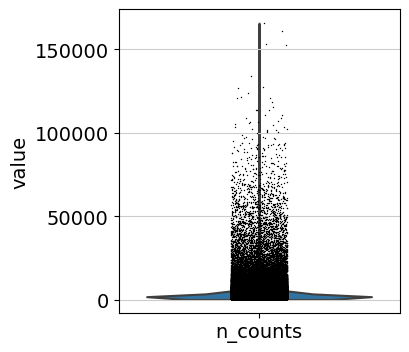

In [20]:
sc.pl.violin(adata, "n_counts")

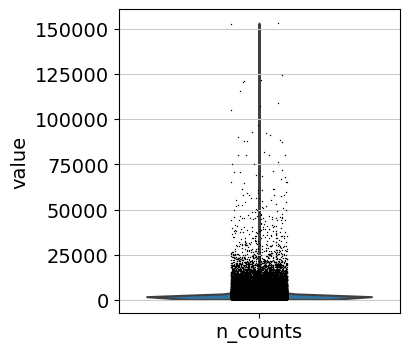

In [53]:
sc.pl.violin(batch_data, "n_counts")

In [2]:
#sort inCITEseq batches
batch_data= adata[adata.obs['prep_type'].isin(['10x3prime_inCITE_soloTE'])]

NameError: name 'adata' is not defined

Plotting batch: Dec22_2022


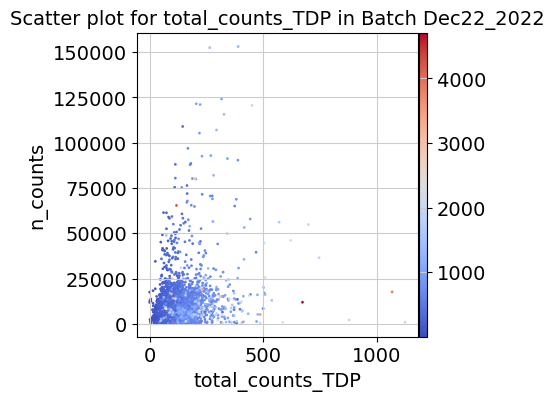

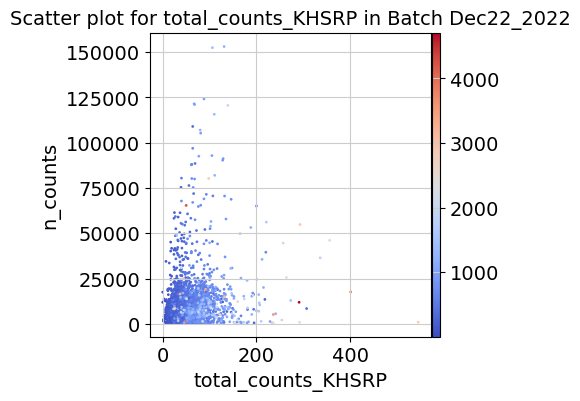

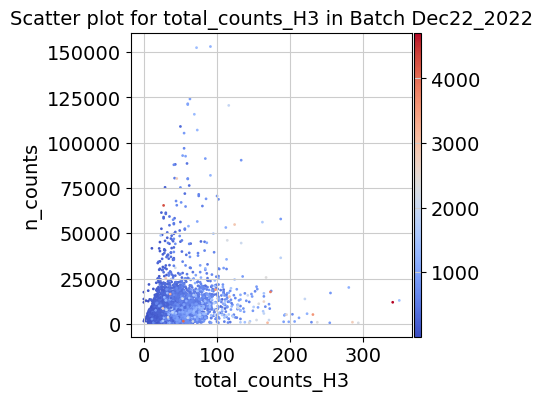

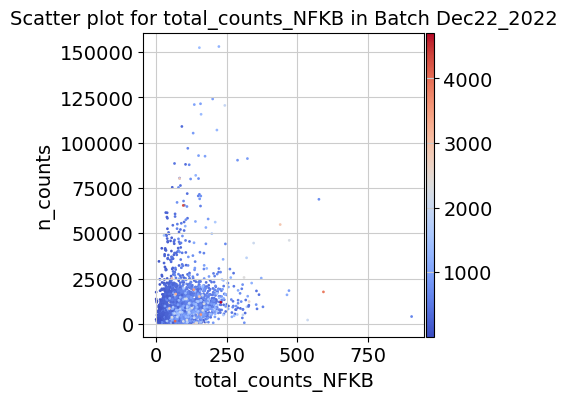

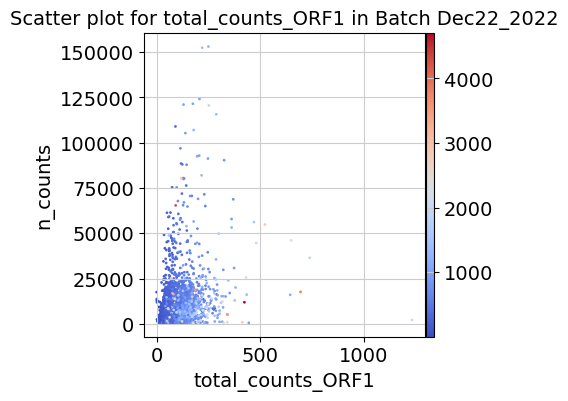

...

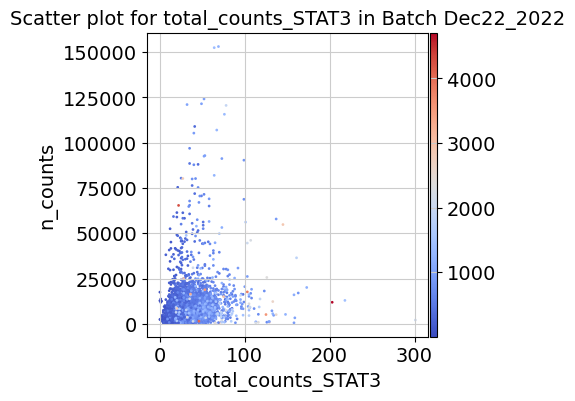

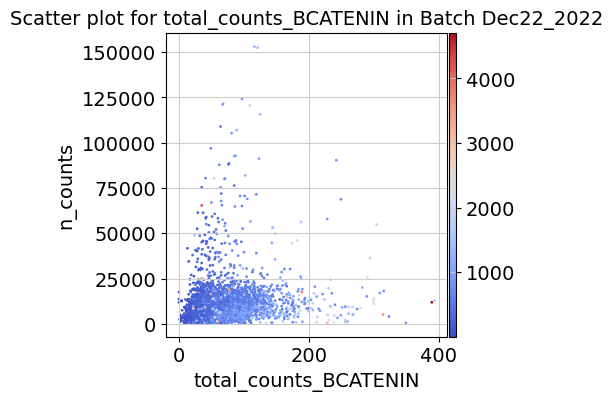

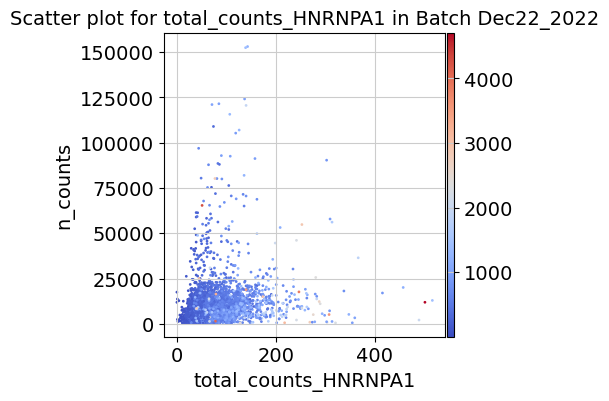

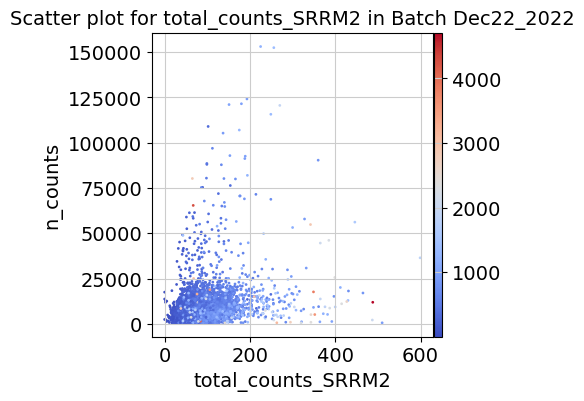

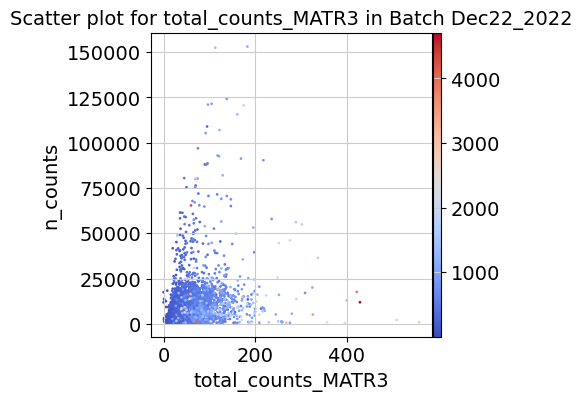

Plotting batch: Oct10_2022


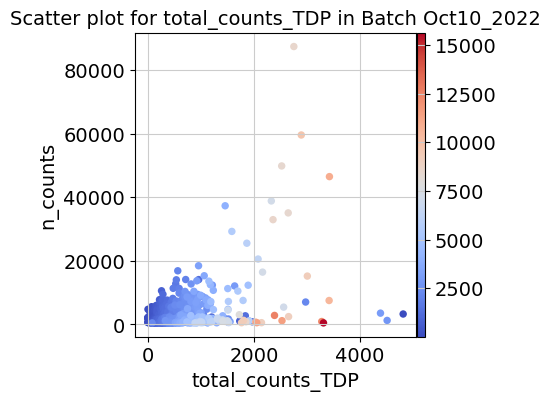

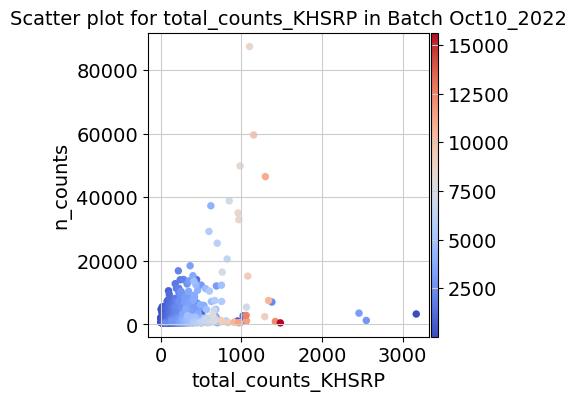

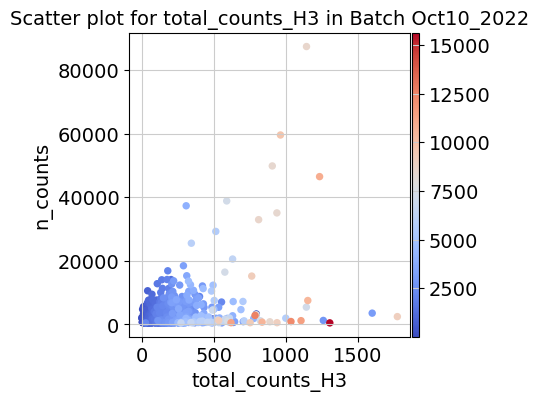

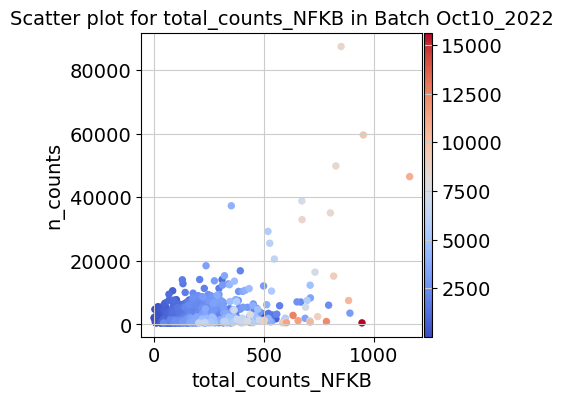

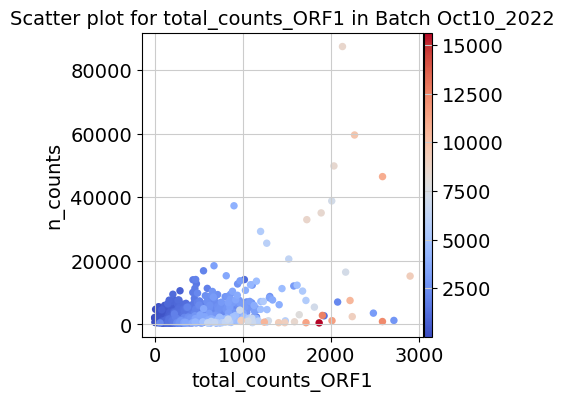

...

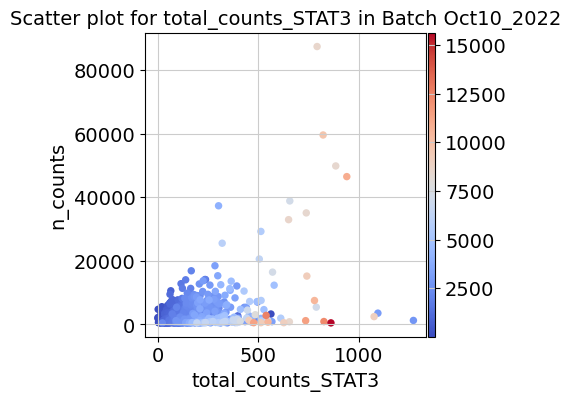

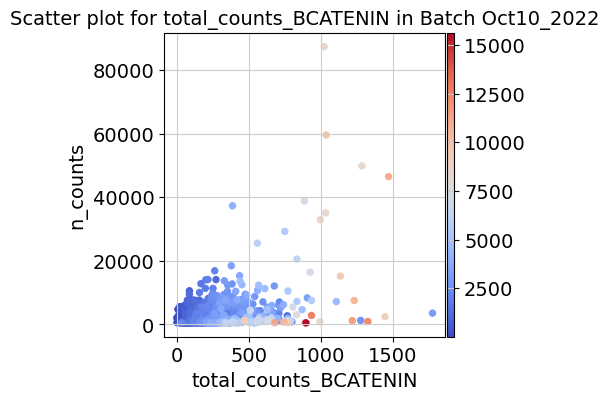

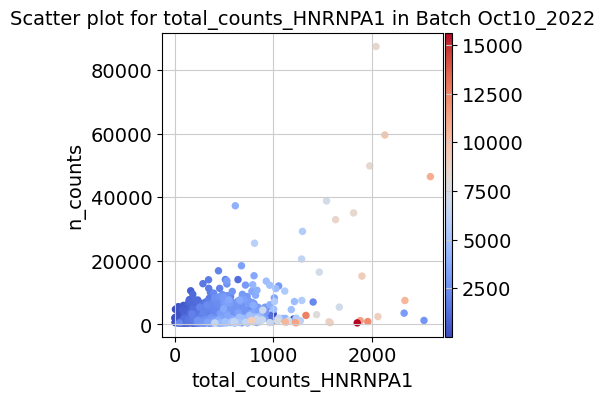

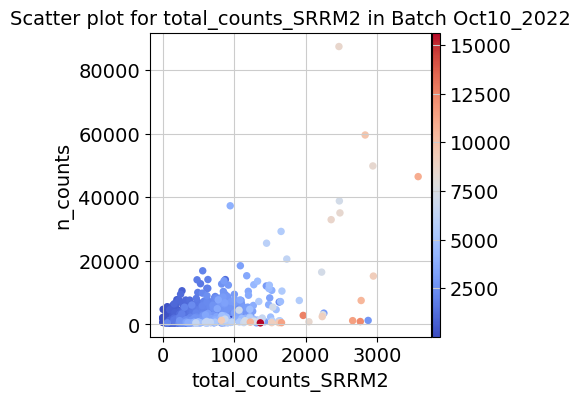

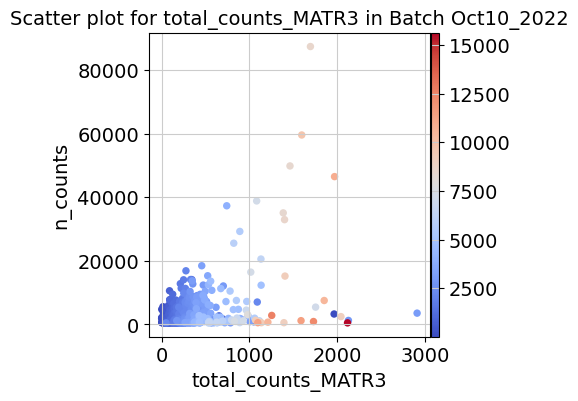

Plotting batch: Oct19_2022


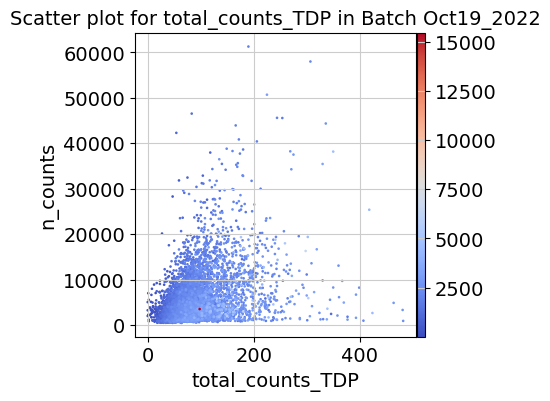

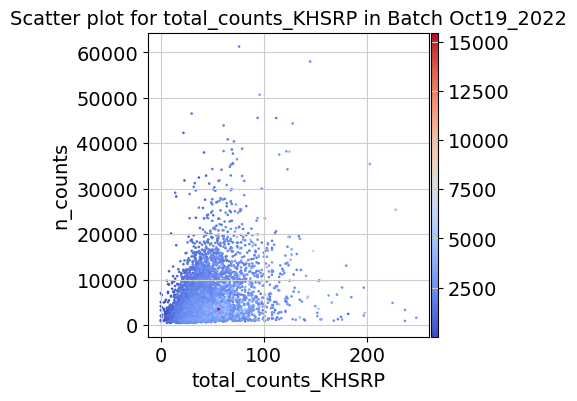

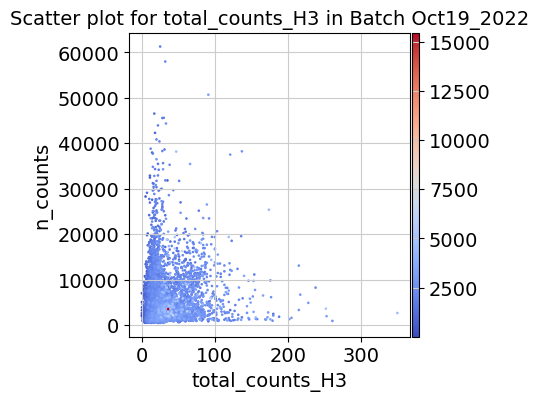

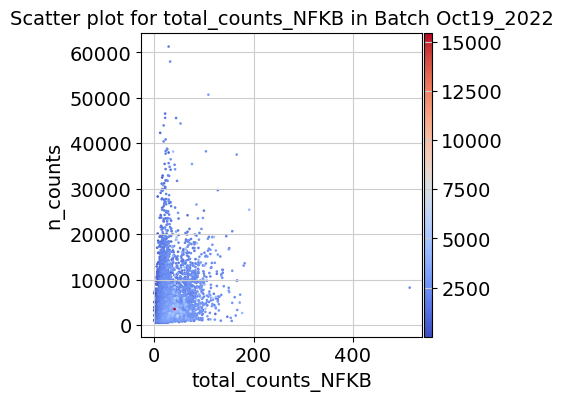

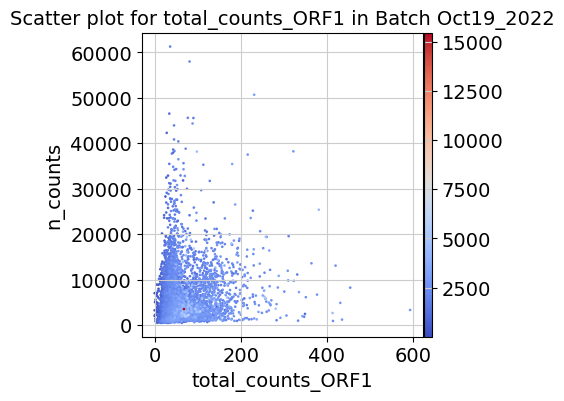

...

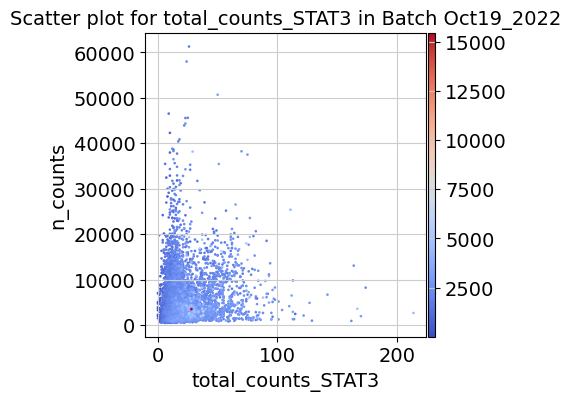

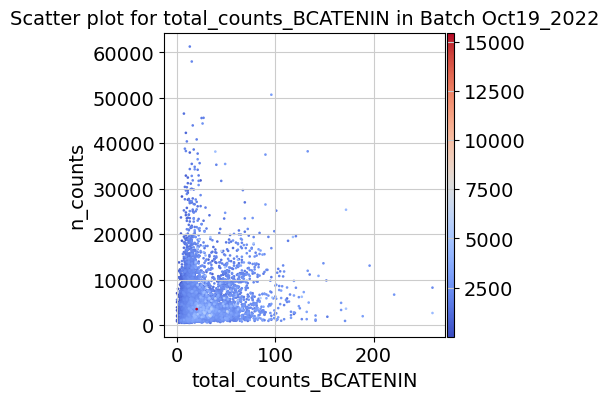

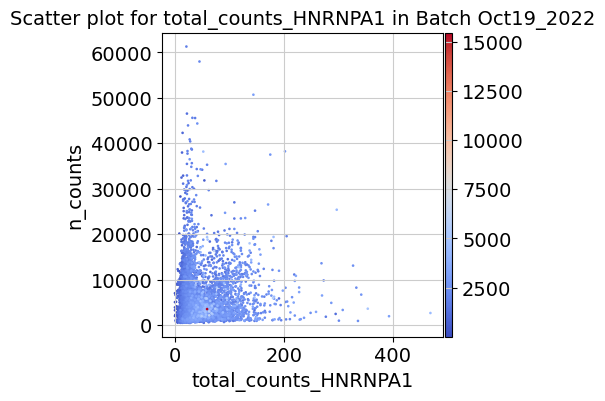

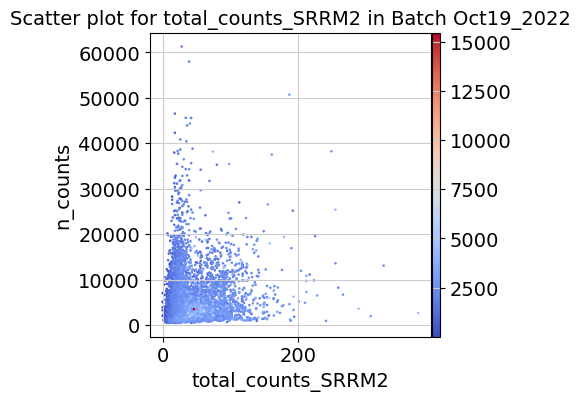

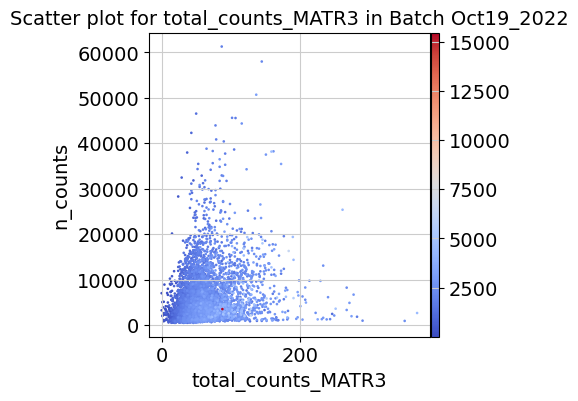

Plotting batch: Jan9_2023


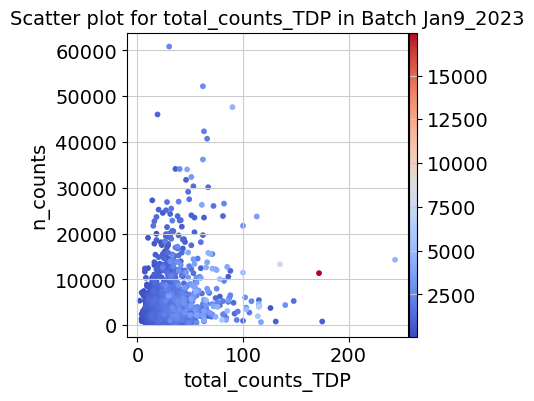

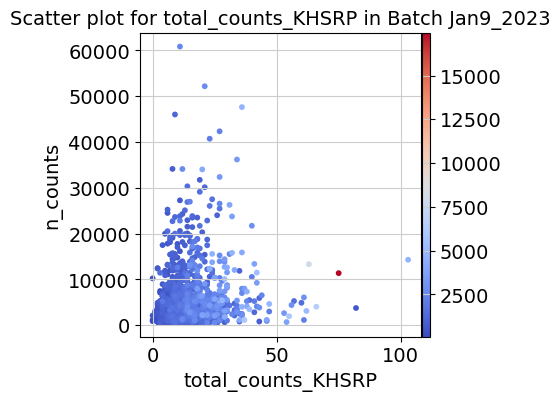

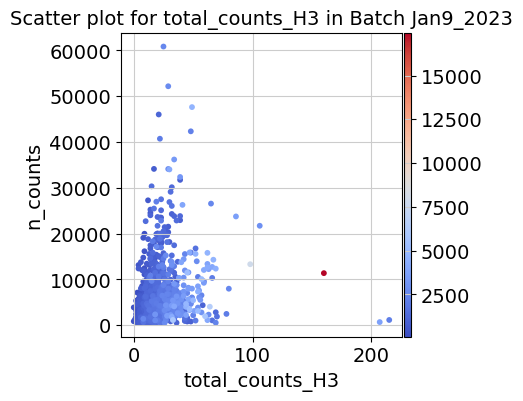

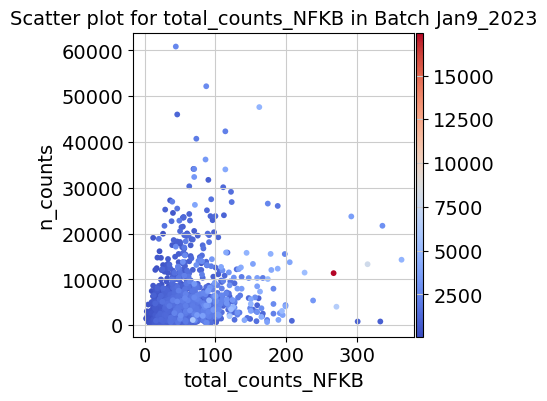

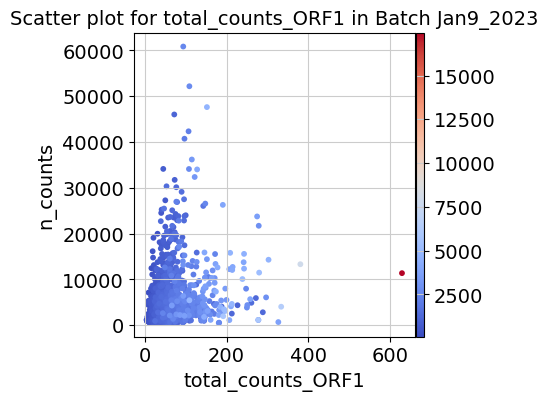

...

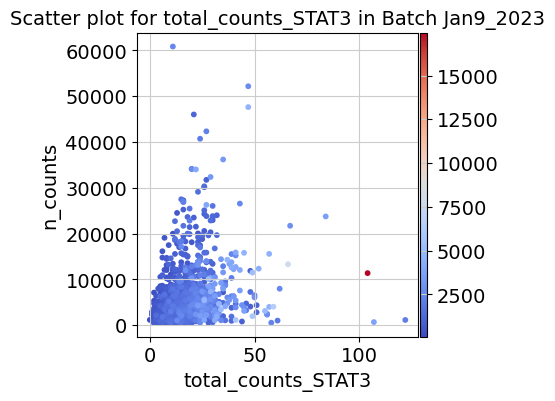

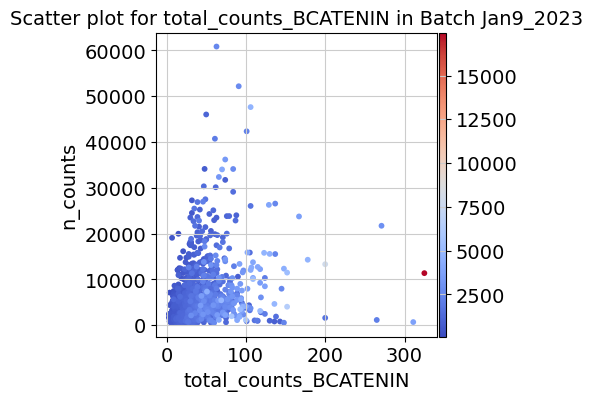

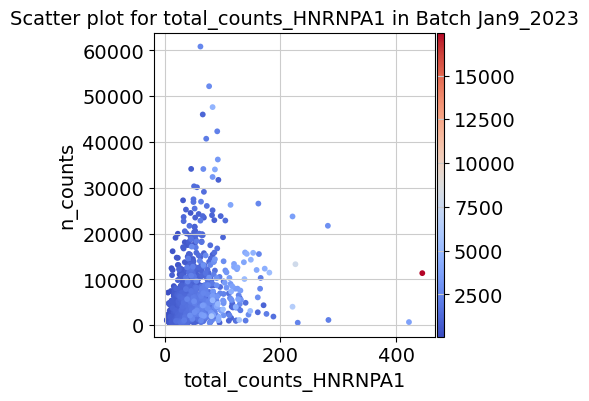

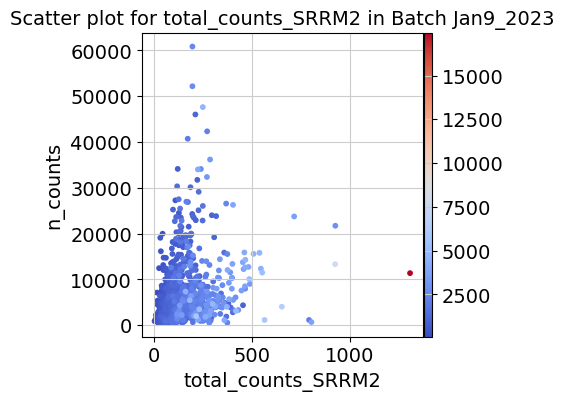

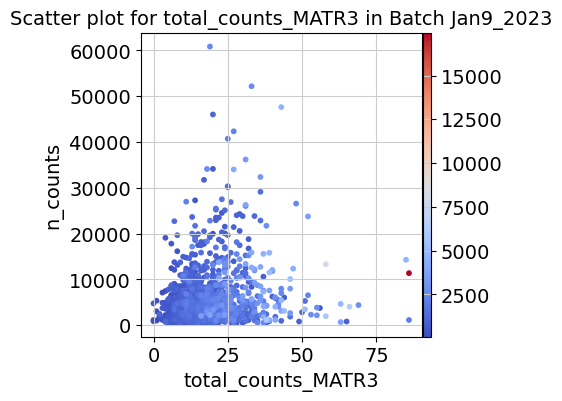

Plotting batch: Jan11_2023


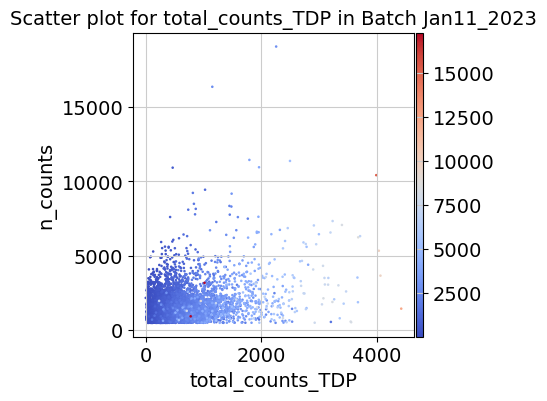

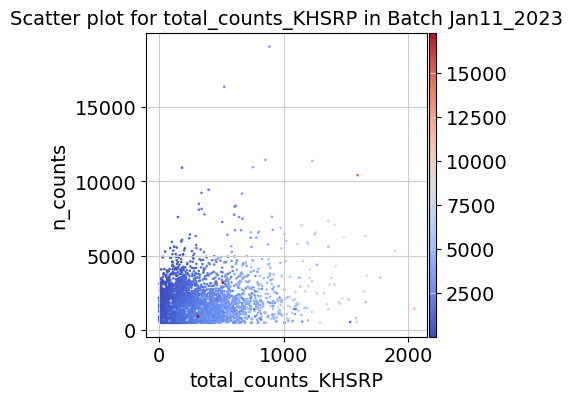

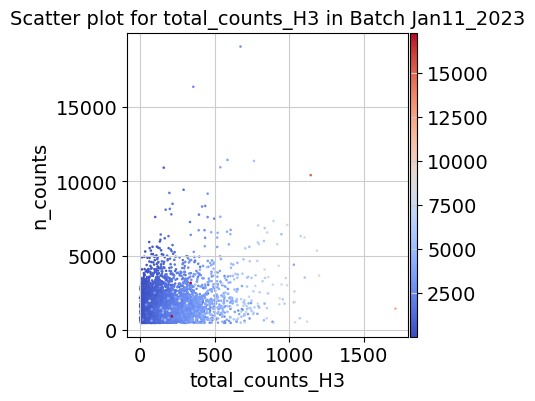

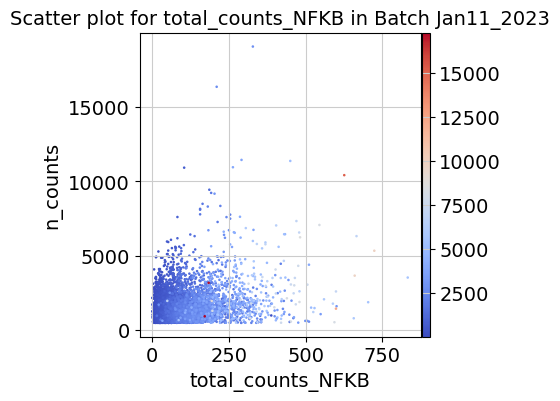

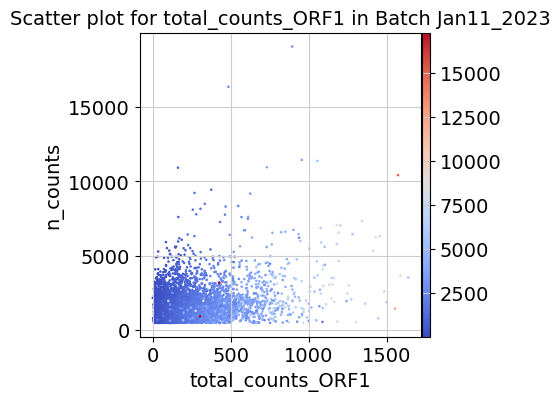

...

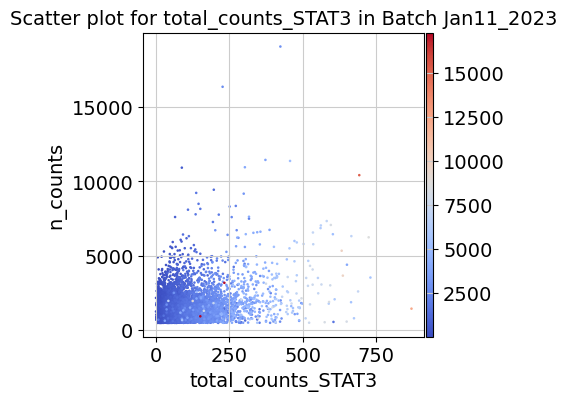

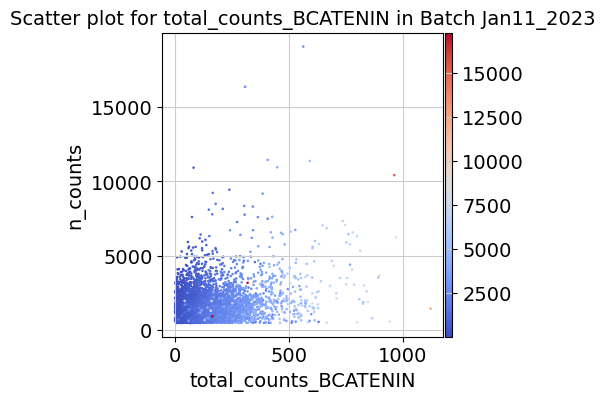

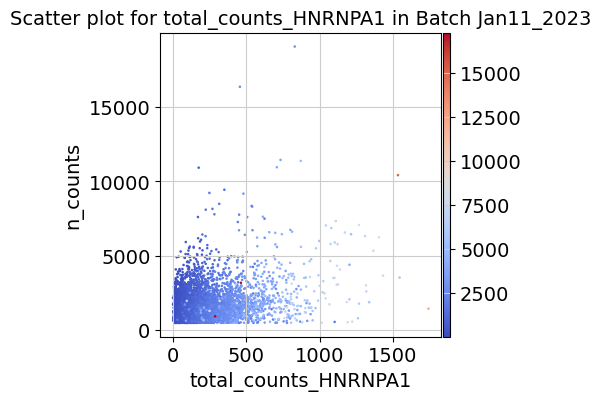

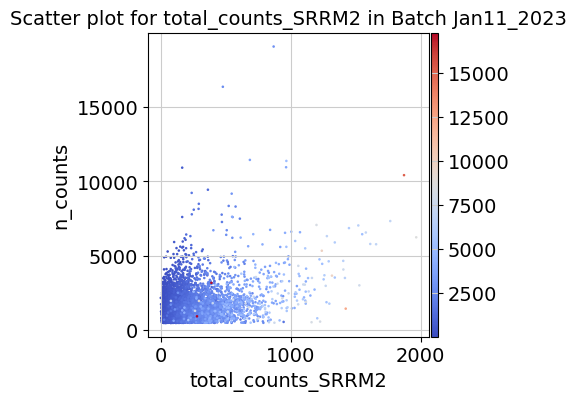

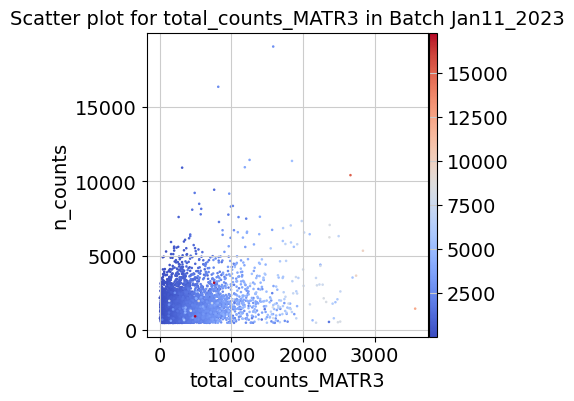

Plotting batch: Jan12_2023


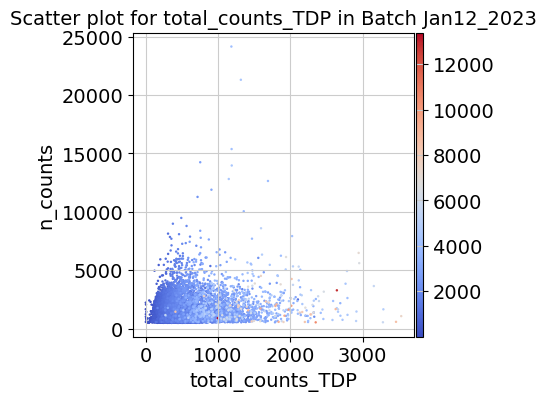

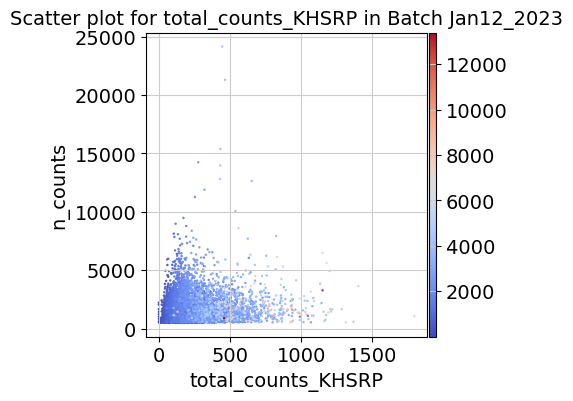

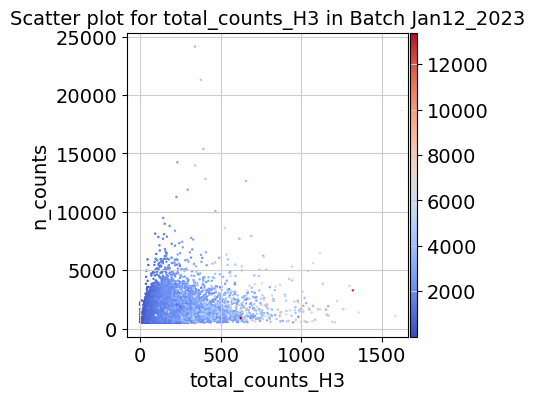

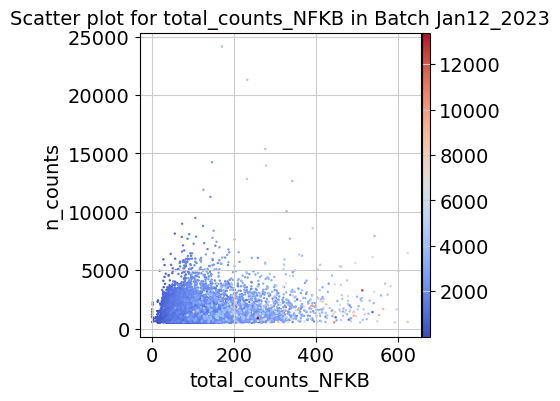

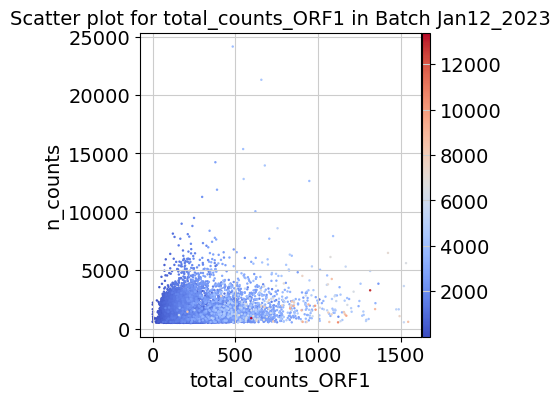

...

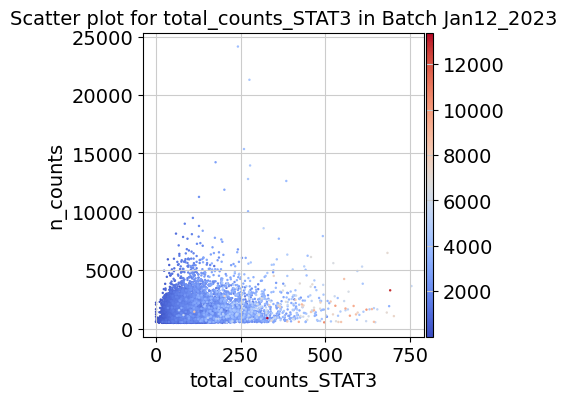

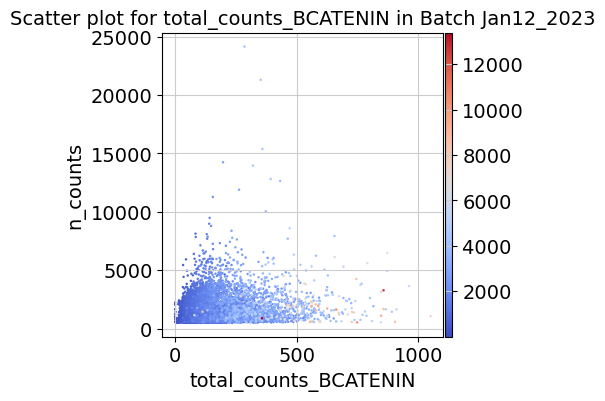

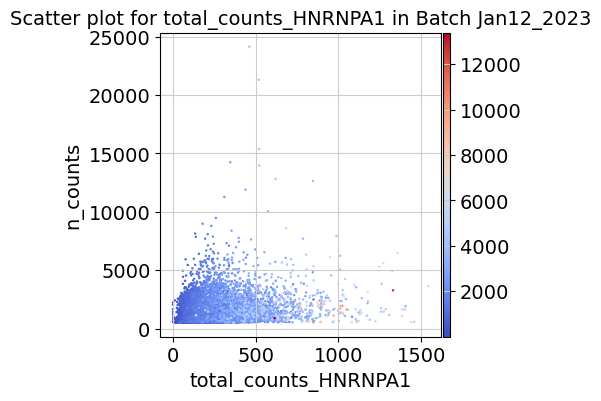

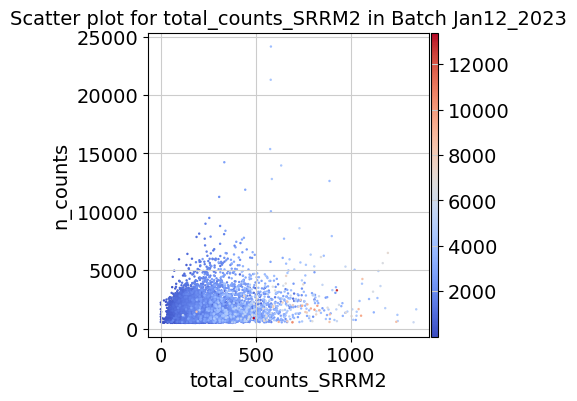

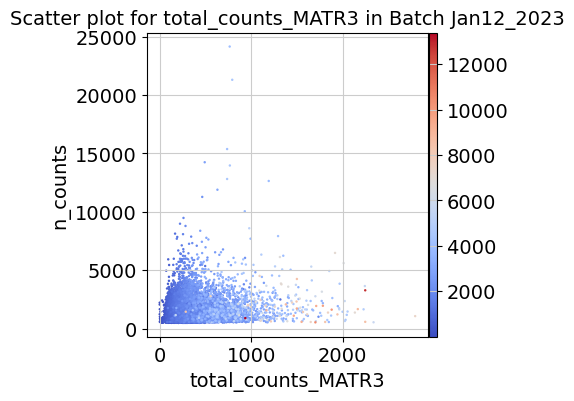

Plotting batch: Jan17_2023


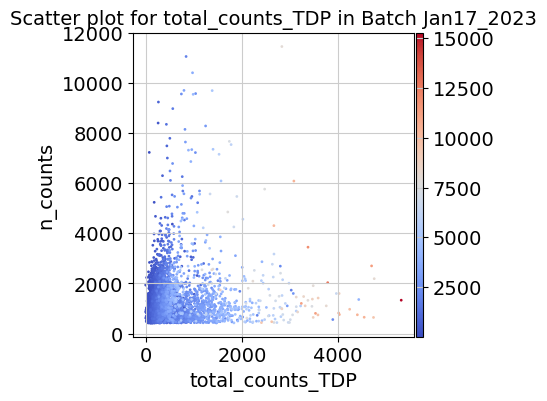

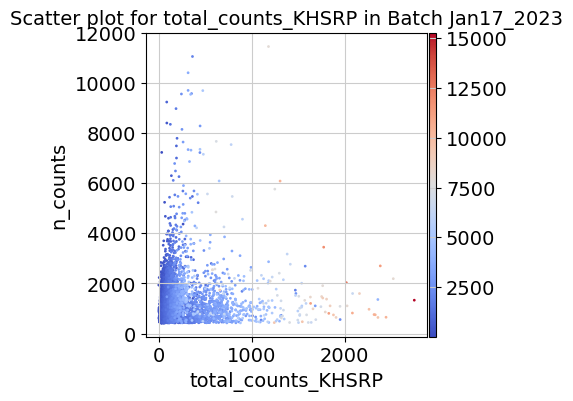

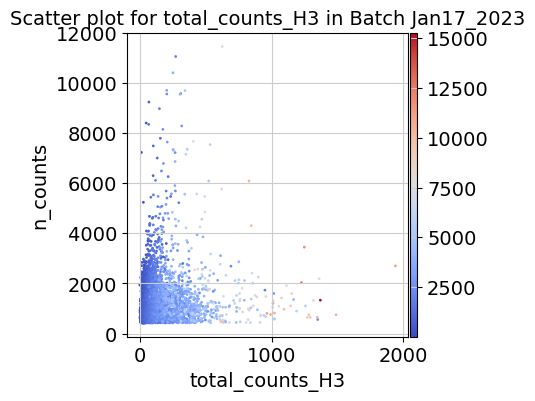

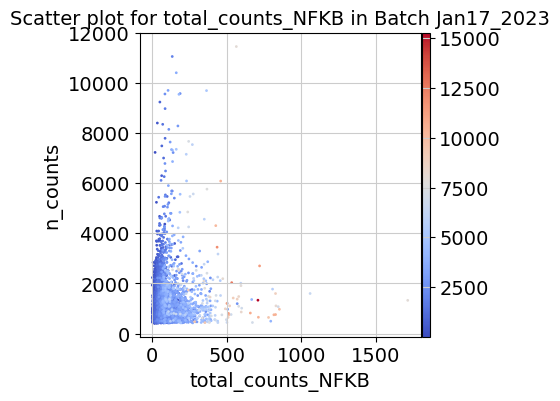

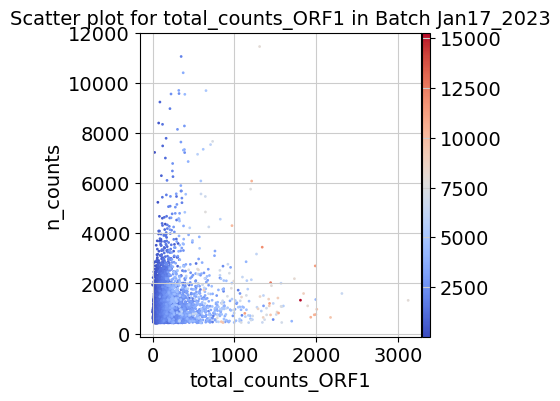

...

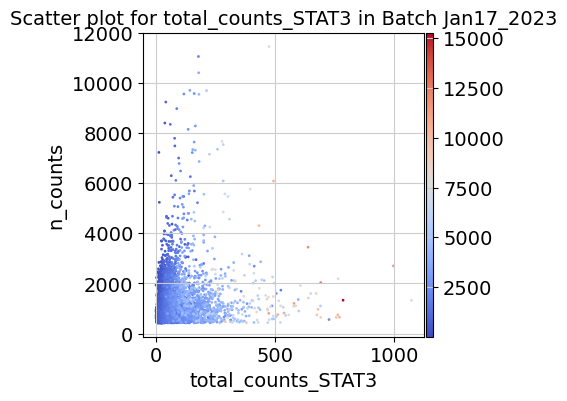

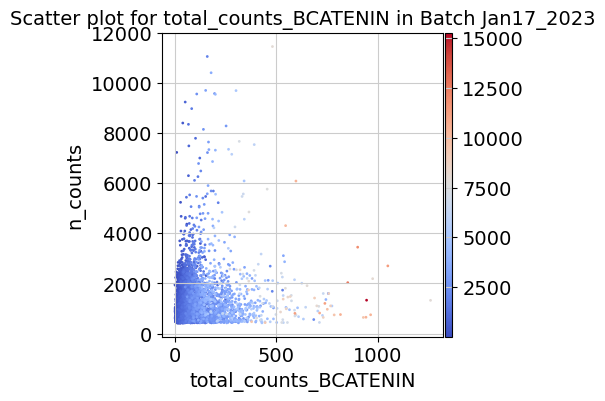

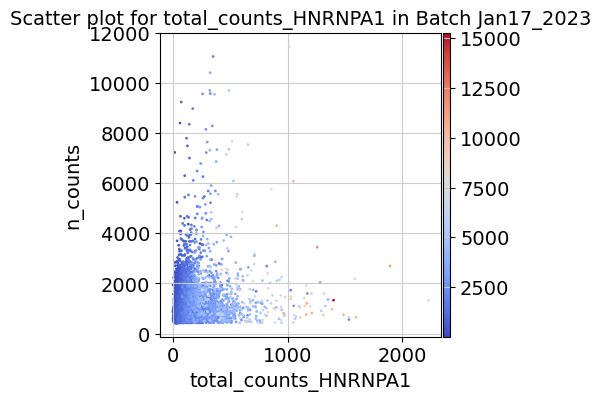

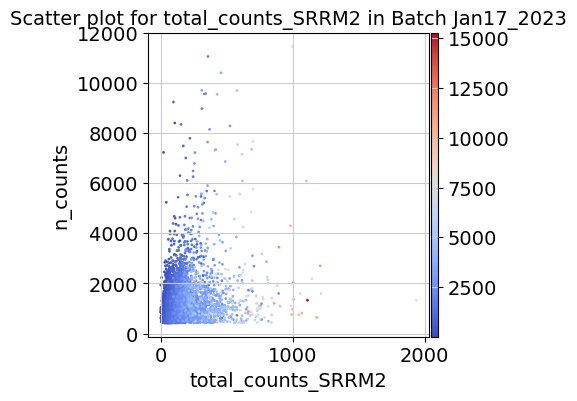

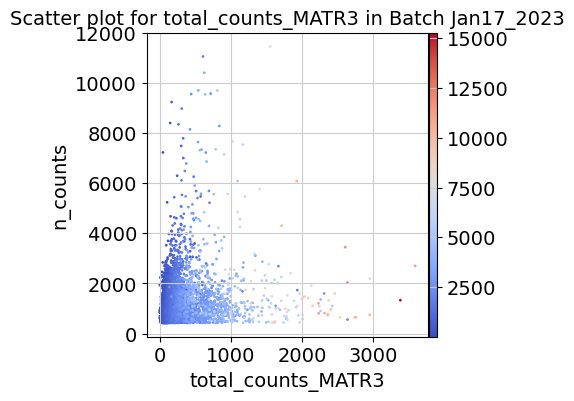

Plotting batch: Jan18_2023


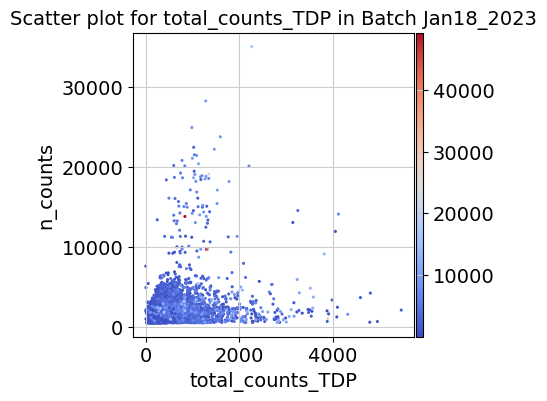

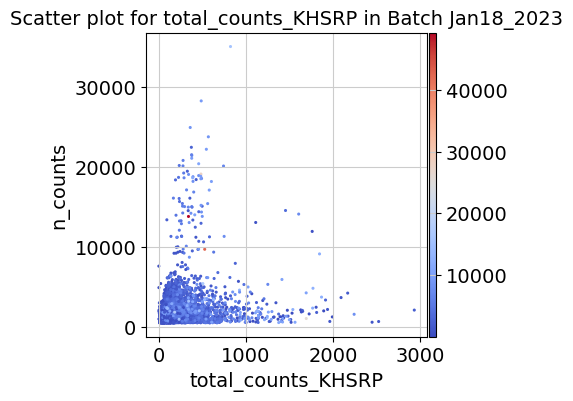

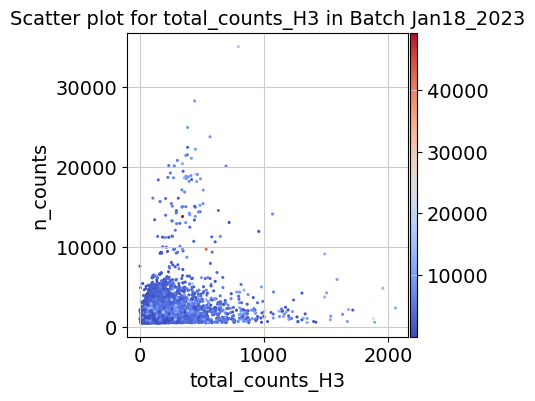

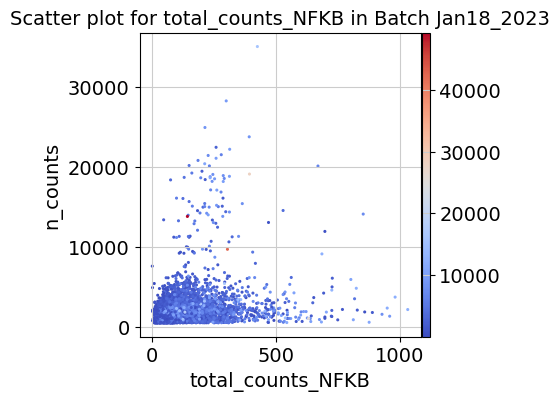

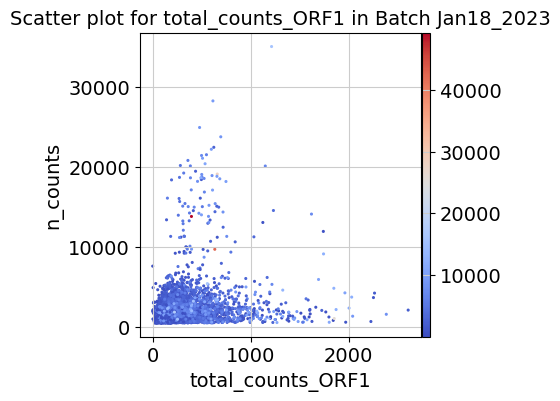

...

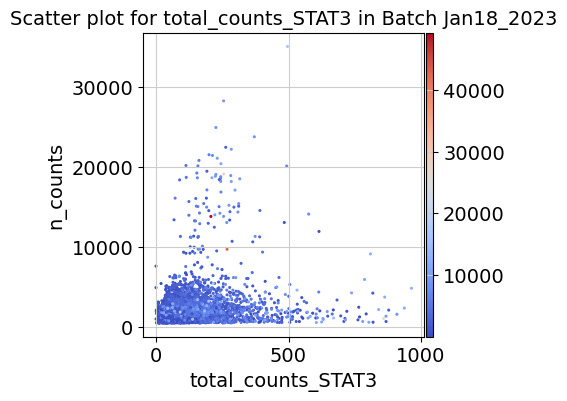

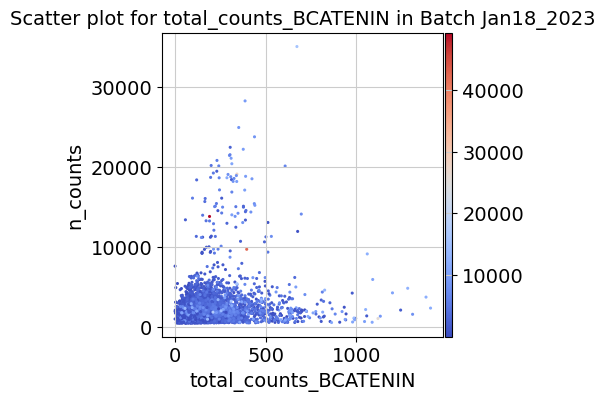

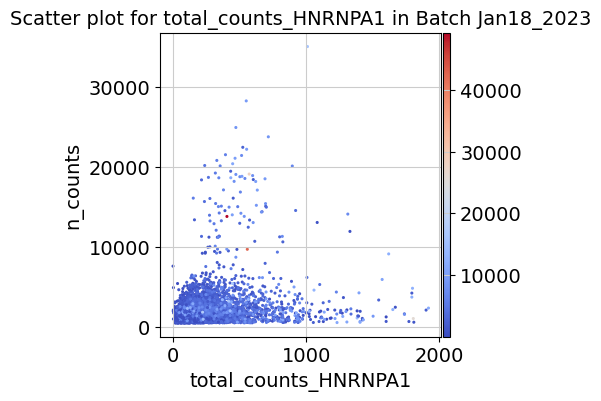

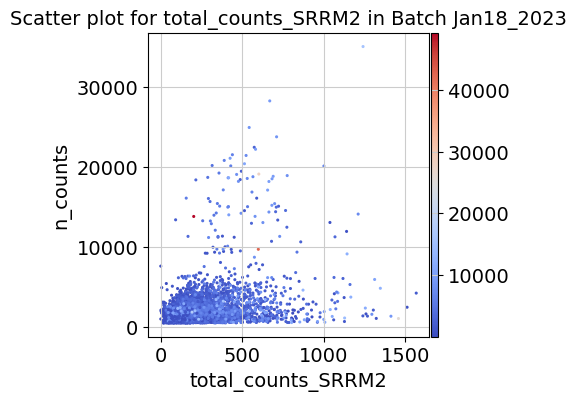

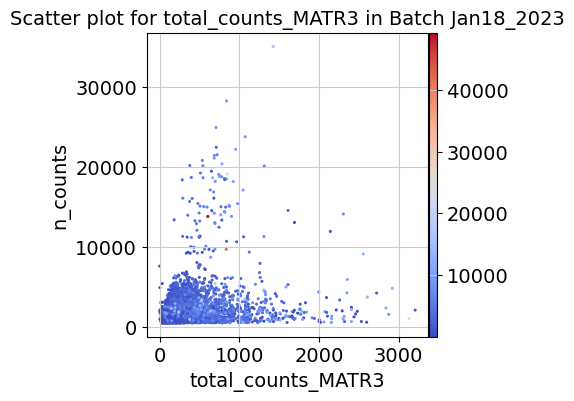

Plotting batch: Jan19A_2023


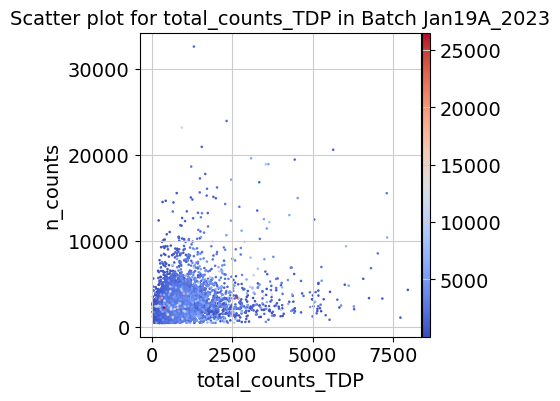

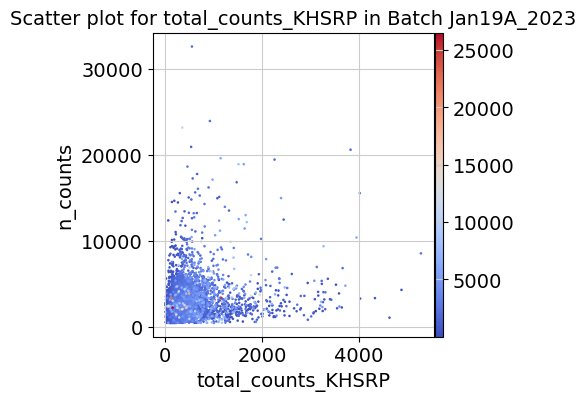

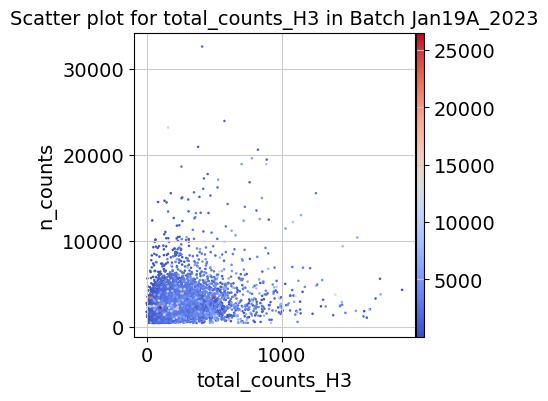

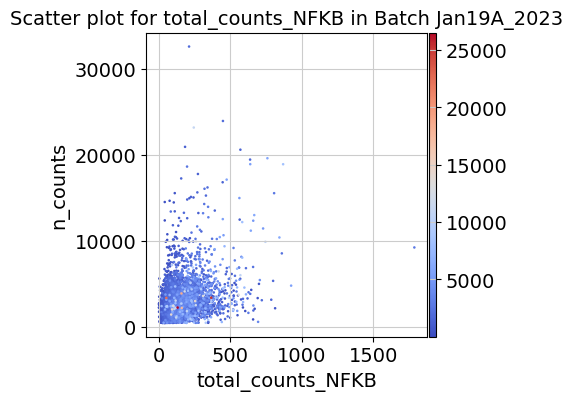

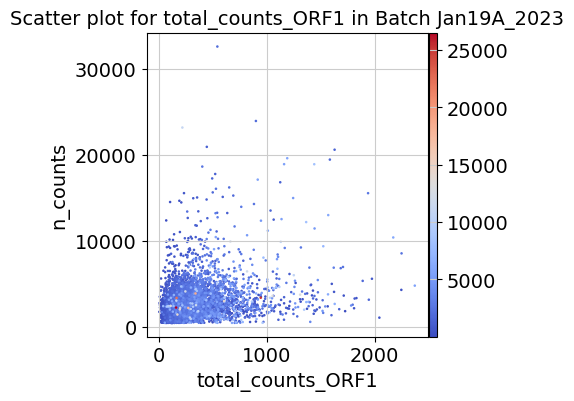

...

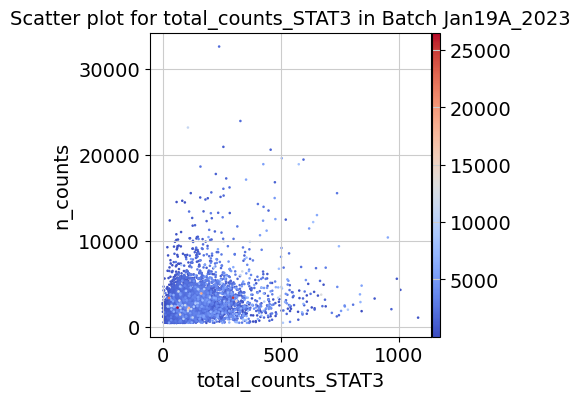

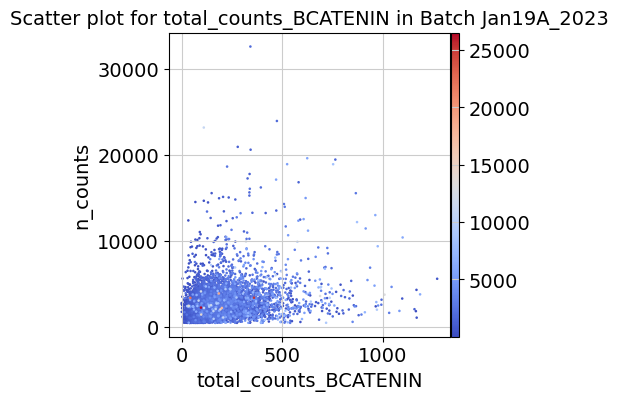

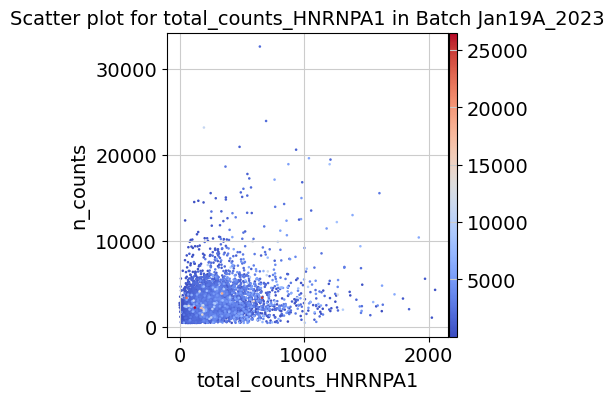

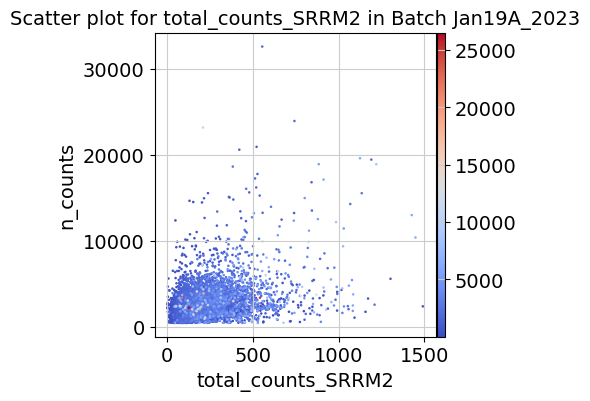

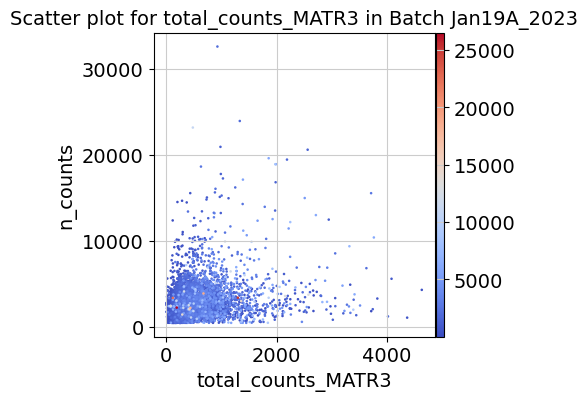

Plotting batch: Jan19B_2023


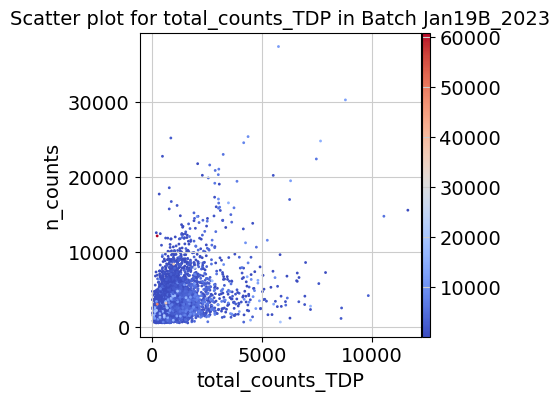

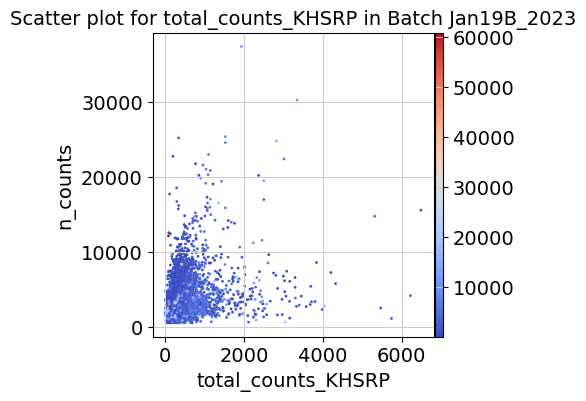

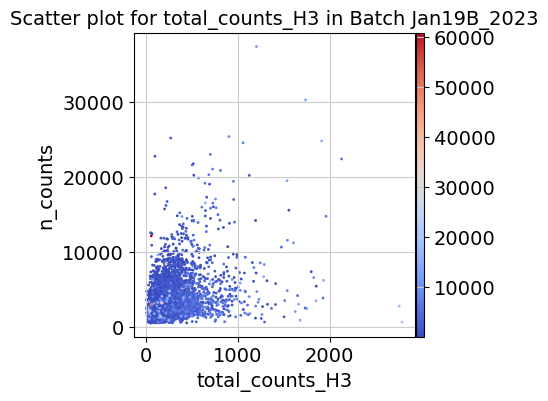

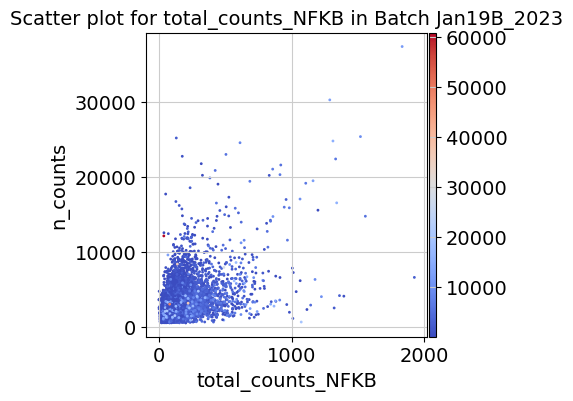

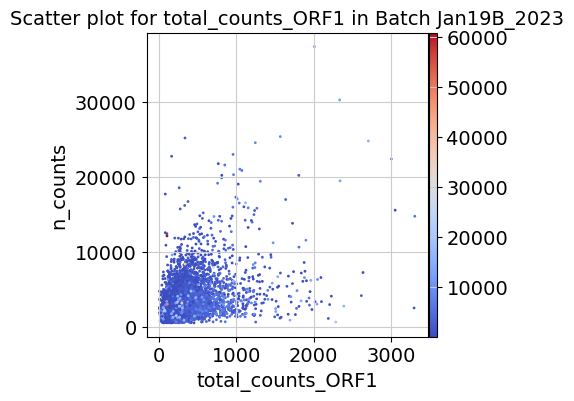

...

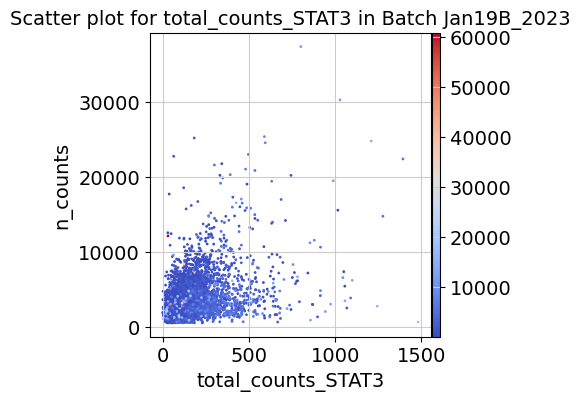

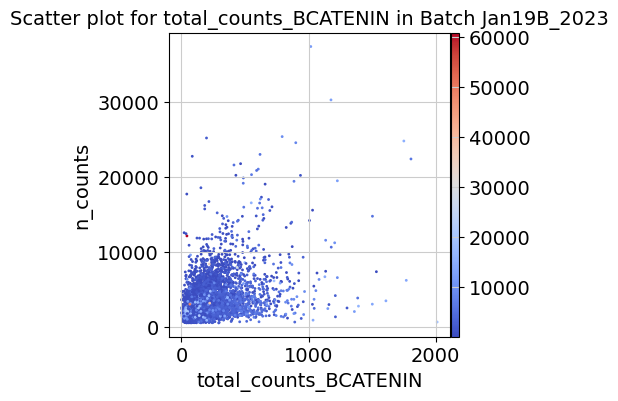

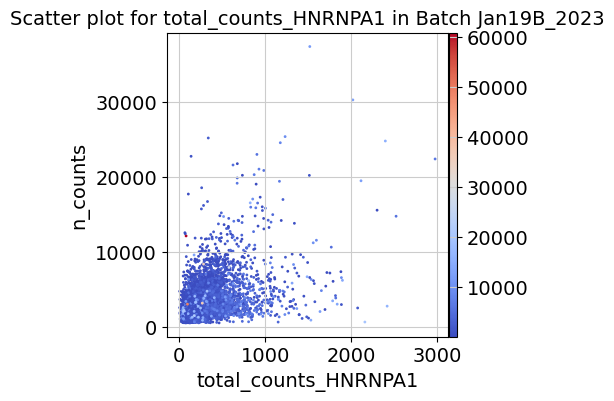

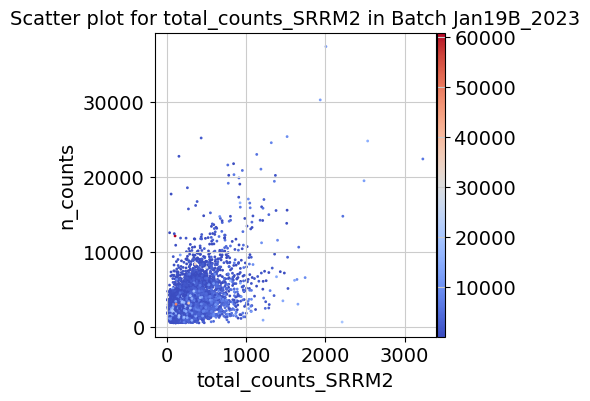

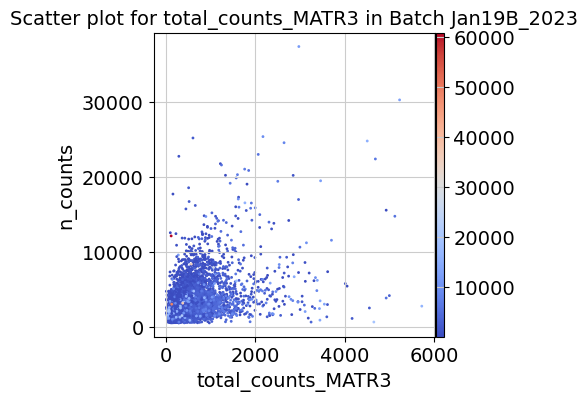

Plotting batch: Jan24A_2023


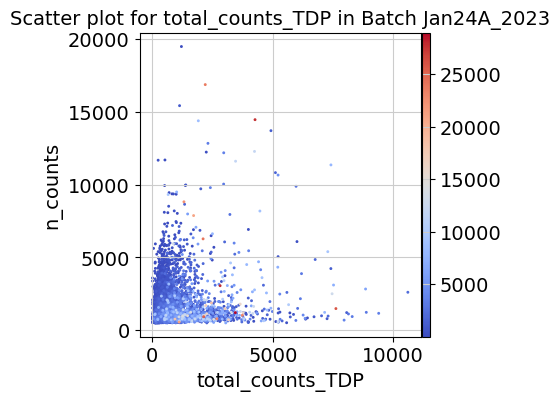

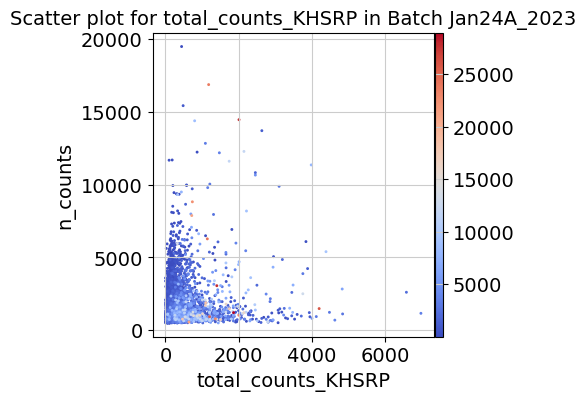

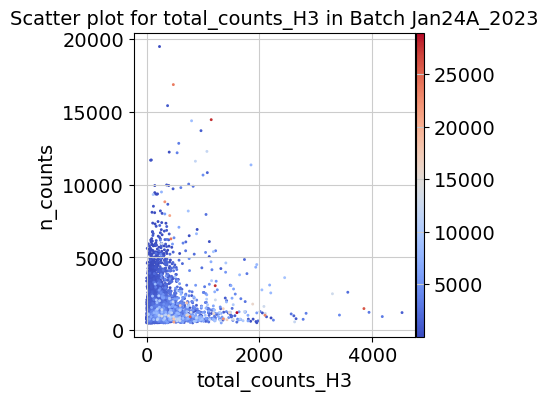

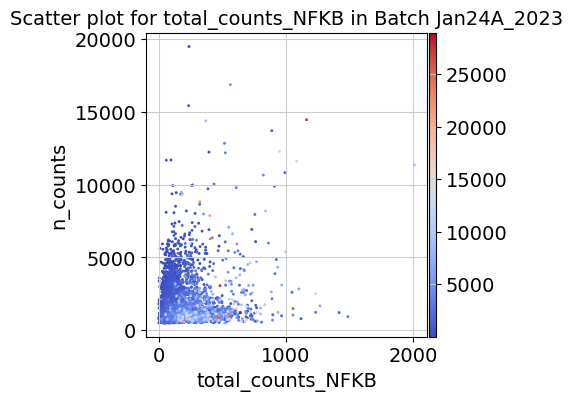

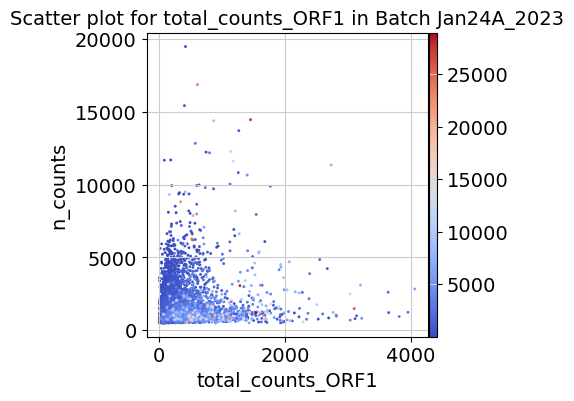

...

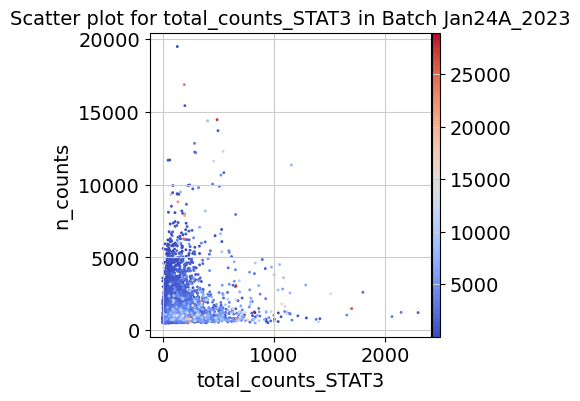

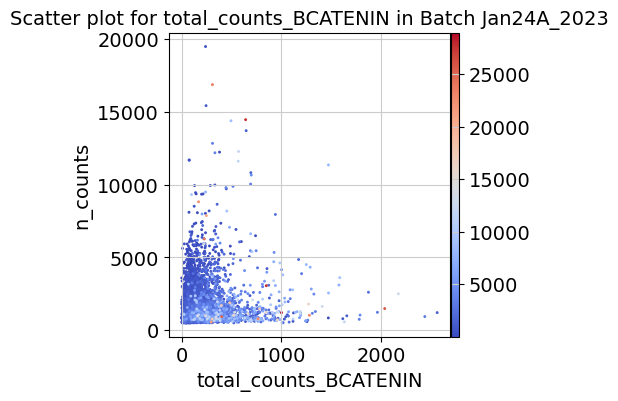

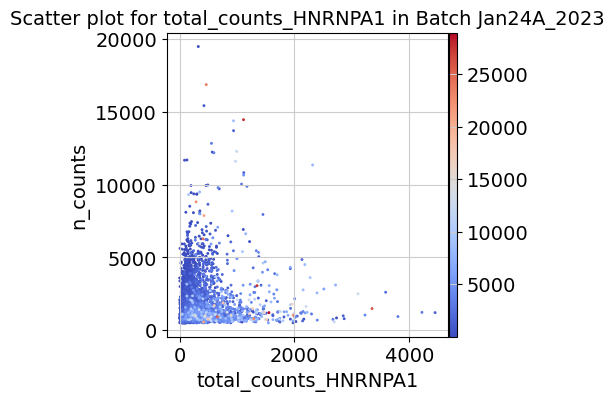

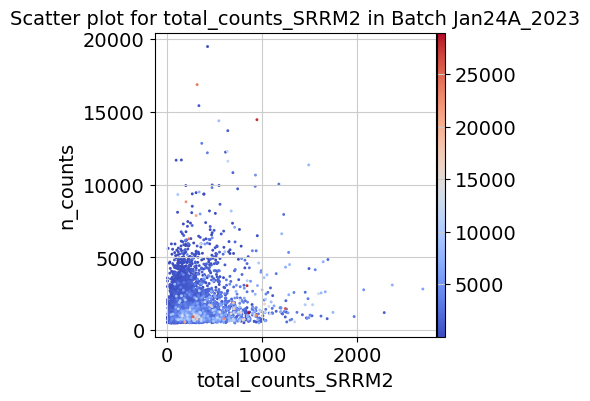

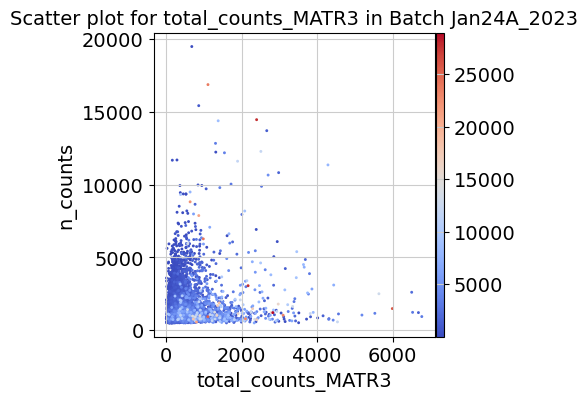

Plotting batch: Jan24B_2023


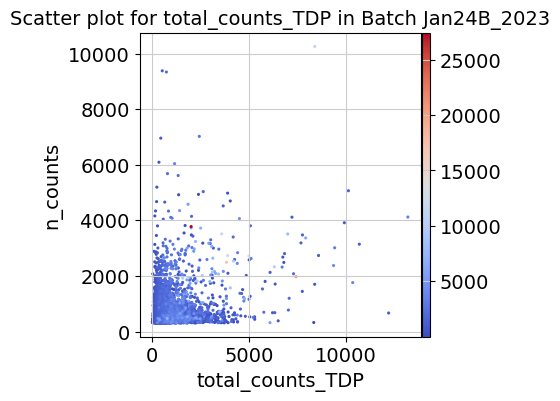

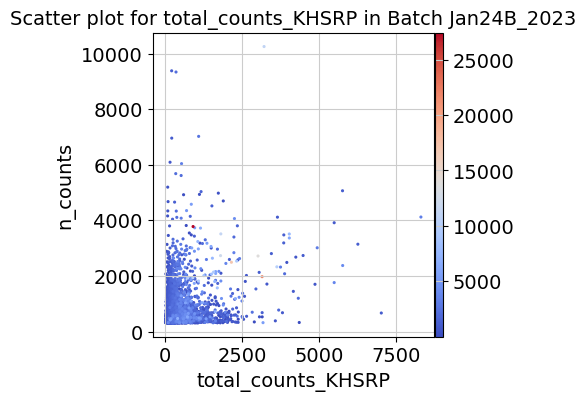

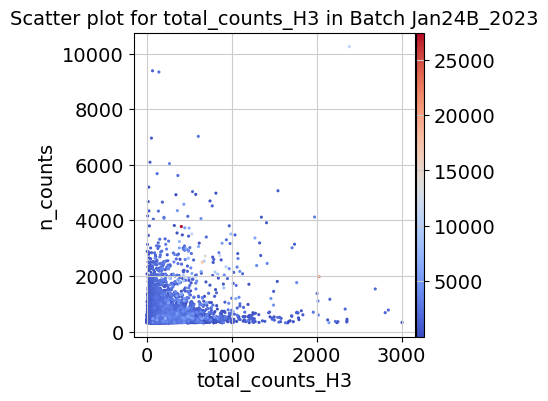

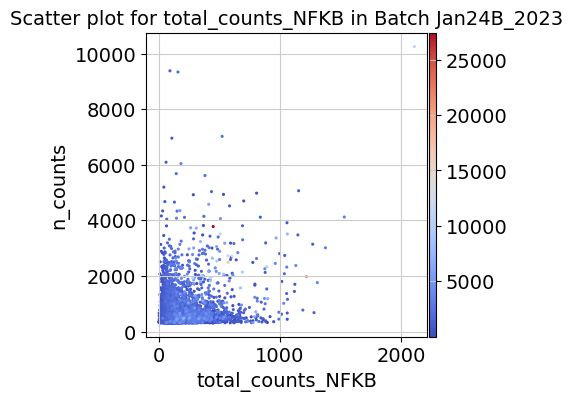

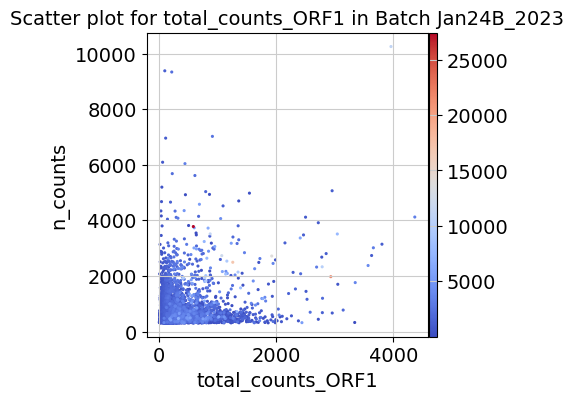

...

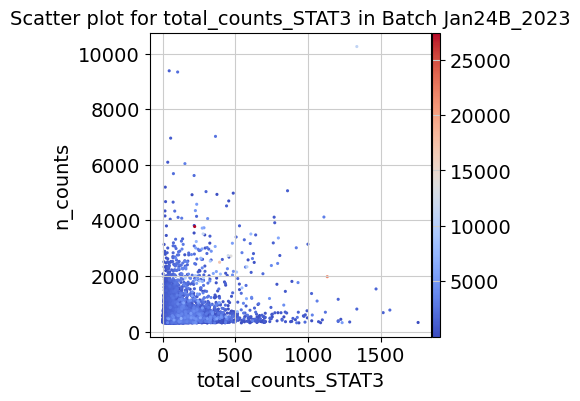

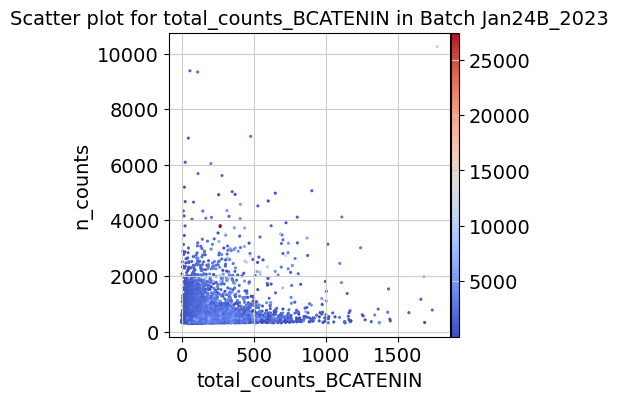

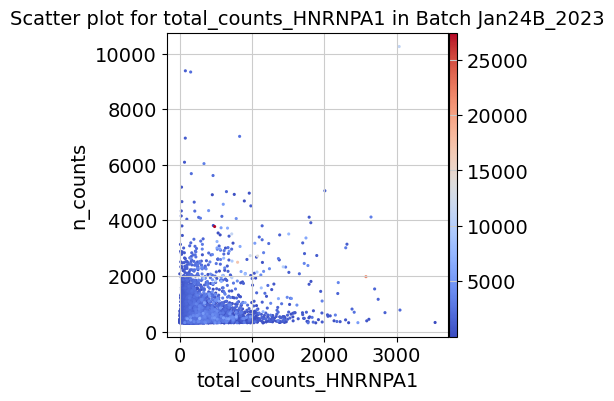

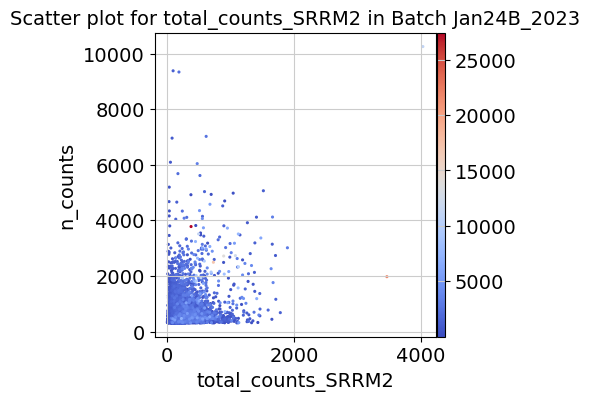

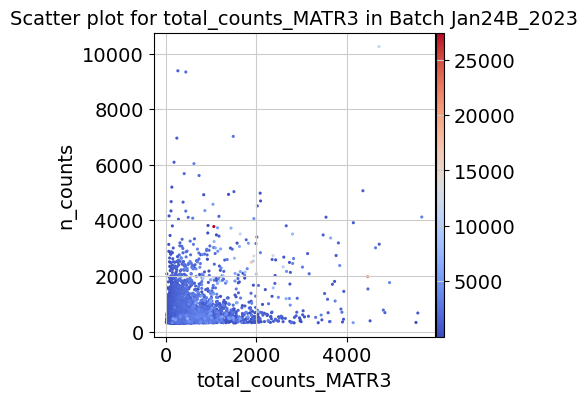

Plotting batch: Jan25_2023


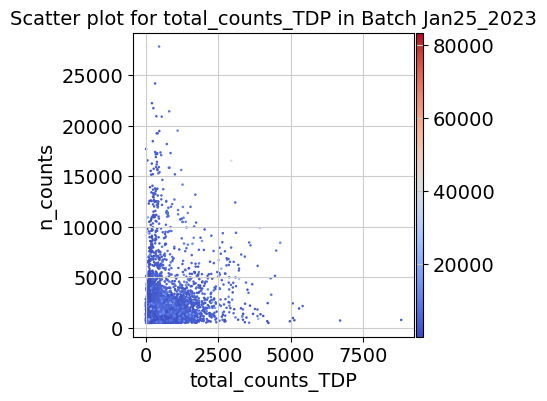

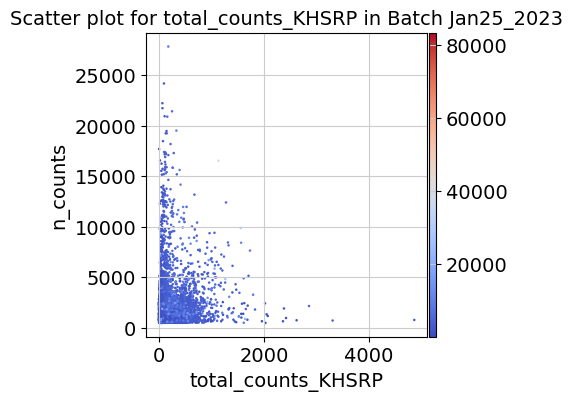

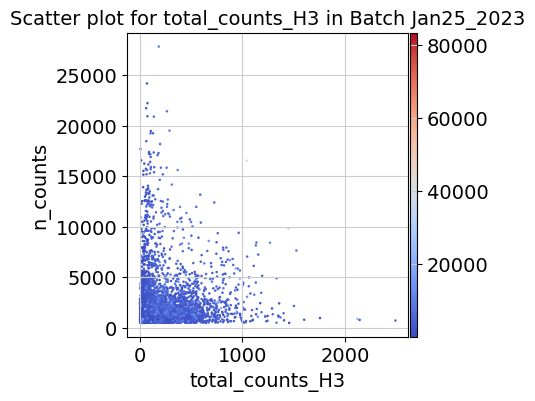

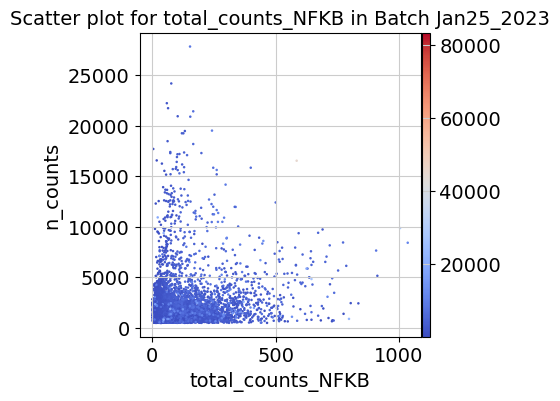

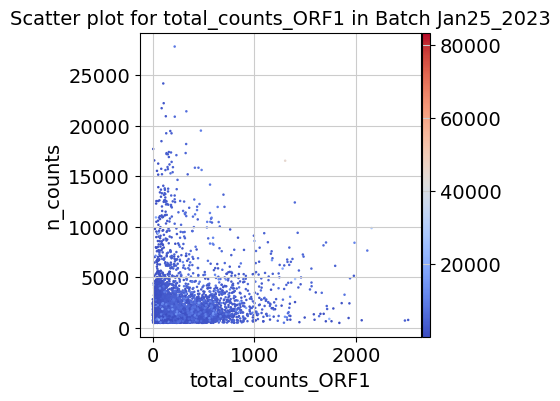

...

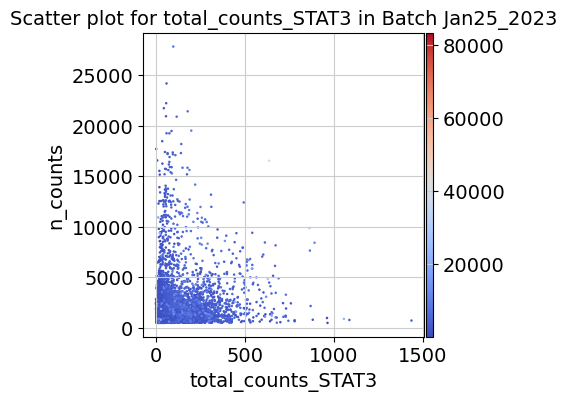

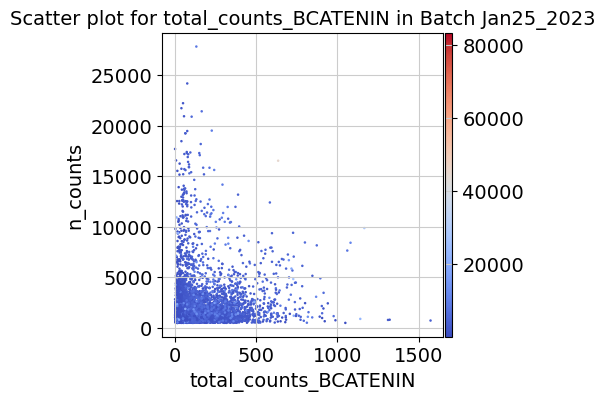

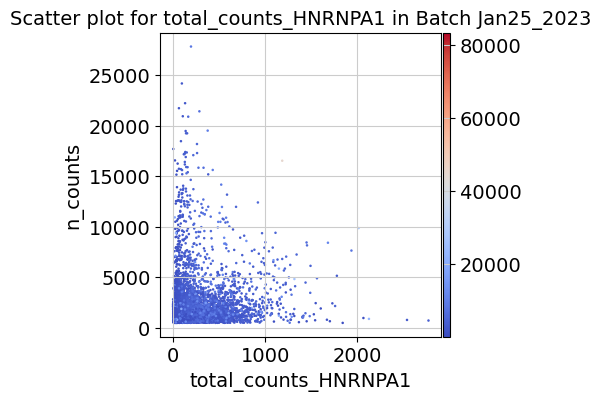

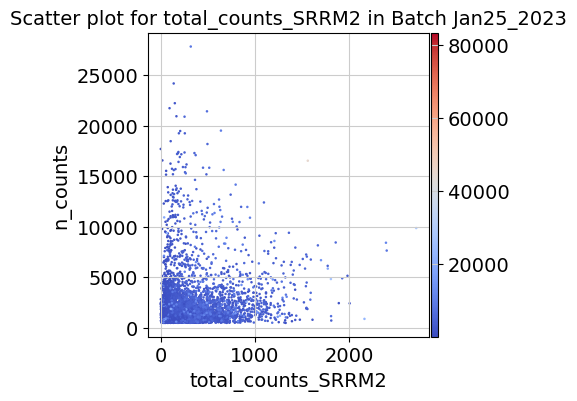

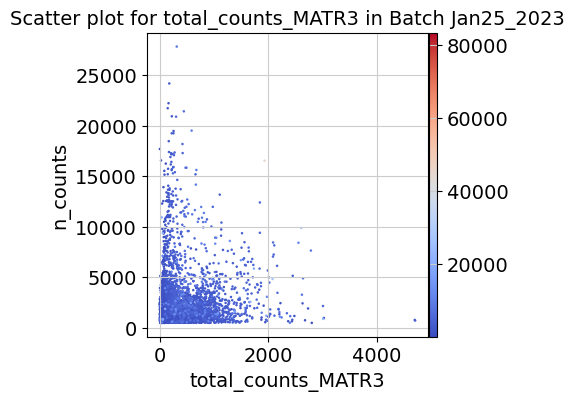

In [54]:
import scanpy as sc

# Set the dpi for the figures
sc.settings.set_figure_params(dpi=50)

# Loop over unique batches in 'date' column
for batch_date in batch_data.obs['date'].unique():
    # Filter the data for the current batch
    batch_subset = batch_data[batch_data.obs['date'] == batch_date, :]
    
    # Print the current batch being plotted
    print(f"Plotting batch: {batch_date}")
    
    # Create a scatter plot for the current batch
    for col in antibodies2:
        sc.pl.scatter(batch_subset, x=col, y='n_counts', color='hashtag_counts', color_map='coolwarm', title=f'Scatter plot for {col} in Batch {batch_date}')

In [ ]:
batch_data = batch_data[batch_data.obs['total_counts_TDP']<3000]
batch_data = batch_data[batch_data.obs['total_counts_H3']>1]


batch_data = batch_data[batch_data.obs['hashtag_counts']<4000]


#batch_data = batch_data[batch_data.obs['n_counts']<35000]

In [58]:
batch_data

View of AnnData object with n_obs × n_vars = 87866 × 36601
    obs: 'date', 'souporcell_status', 'souporcell_assignment', 'demux_type', 'assignment', 'hashtag_counts', 'Demux2_assignment', 'Demux2_droplet_type', 'batch', 'prep_type', 'Demux2_plus_demuxem_assignment', 'total_counts_TDP', 'total_counts_KHSRP', 'total_counts_H3', 'total_counts_NFKB', 'total_counts_ORF1', 'total_counts_PTBP1', 'total_counts_ORF2', 'total_counts_STAT3', 'total_counts_BCATENIN', 'total_counts_HNRNPA1', 'total_counts_SRRM2', 'total_counts_MATR3', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'new_status', 'Exclusion', 'date.1', 'bank', 'region', 'Sex', 'Age', 'DiseaseState', 'SampleID', 'PostmortemInterval', 'NIHBankRIN', 'MurphyLabRIN', 'JoinedRIN', 'FACs_NeuN_Percentage', 'FACs_ErgHi_Percentage', 'FACs_ErgLo_Percentage', 'Sequence_ApoE_allele', 'Pathology_BrainWeight (g)', 'SampleID_Gel', 'Gel', 'Vcam_rel_to_Amyl_Gapdh', 'Vcam_topband', 'Vcam_65', 'Vcam_32', 'Vcam_topband_rel_to_gapdh', 

In [59]:
adata= adata[adata.obs['new_status'].isin(['singlet'])]

In [60]:
adata

View of AnnData object with n_obs × n_vars = 164246 × 36601
    obs: 'date', 'souporcell_status', 'souporcell_assignment', 'demux_type', 'assignment', 'hashtag_counts', 'Demux2_assignment', 'Demux2_droplet_type', 'batch', 'prep_type', 'Demux2_plus_demuxem_assignment', 'total_counts_TDP', 'total_counts_KHSRP', 'total_counts_H3', 'total_counts_NFKB', 'total_counts_ORF1', 'total_counts_PTBP1', 'total_counts_ORF2', 'total_counts_STAT3', 'total_counts_BCATENIN', 'total_counts_HNRNPA1', 'total_counts_SRRM2', 'total_counts_MATR3', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'new_status', 'Exclusion', 'date.1', 'bank', 'region', 'Sex', 'Age', 'DiseaseState', 'SampleID', 'PostmortemInterval', 'NIHBankRIN', 'MurphyLabRIN', 'JoinedRIN', 'FACs_NeuN_Percentage', 'FACs_ErgHi_Percentage', 'FACs_ErgLo_Percentage', 'Sequence_ApoE_allele', 'Pathology_BrainWeight (g)', 'SampleID_Gel', 'Gel', 'Vcam_rel_to_Amyl_Gapdh', 'Vcam_topband', 'Vcam_65', 'Vcam_32', 'Vcam_topband_rel_to_gapdh',

In [61]:
def normalize_CITE_H3(ad_obj, ab_list):    
    import scipy
    # normalize all CITE ab by doing ab+1 / hashtag_counts (inflated pseudocount)
    for ab in ab_list: 
        # nADT
        ab_x = (ad_obj.obs[ab]+1)/ad_obj.obs['total_counts_H3']
        ad_obj.obs[ab+'_norm_H3'] = ab_x
        
        # normalized ratio (nCLR) like seurate
        geo_mean = scipy.stats.mstats.gmean(ab_x[~np.isnan(ab_x)])
        ad_obj.obs[ab+'_nCLR_H3'] = np.log(ab_x/geo_mean)

In [62]:
normalize_CITE_H3(batch_data, antibodies2) #THIS RAN!!

/tmp/ipykernel_2177617/2167531313.py:7: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad_obj.obs[ab+'_norm_H3'] = ab_x


In [63]:
batch_data

AnnData object with n_obs × n_vars = 87866 × 36601
    obs: 'date', 'souporcell_status', 'souporcell_assignment', 'demux_type', 'assignment', 'hashtag_counts', 'Demux2_assignment', 'Demux2_droplet_type', 'batch', 'prep_type', 'Demux2_plus_demuxem_assignment', 'total_counts_TDP', 'total_counts_KHSRP', 'total_counts_H3', 'total_counts_NFKB', 'total_counts_ORF1', 'total_counts_PTBP1', 'total_counts_ORF2', 'total_counts_STAT3', 'total_counts_BCATENIN', 'total_counts_HNRNPA1', 'total_counts_SRRM2', 'total_counts_MATR3', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'new_status', 'Exclusion', 'date.1', 'bank', 'region', 'Sex', 'Age', 'DiseaseState', 'SampleID', 'PostmortemInterval', 'NIHBankRIN', 'MurphyLabRIN', 'JoinedRIN', 'FACs_NeuN_Percentage', 'FACs_ErgHi_Percentage', 'FACs_ErgLo_Percentage', 'Sequence_ApoE_allele', 'Pathology_BrainWeight (g)', 'SampleID_Gel', 'Gel', 'Vcam_rel_to_Amyl_Gapdh', 'Vcam_topband', 'Vcam_65', 'Vcam_32', 'Vcam_topband_rel_to_gapdh', 'Vcam65_

In [65]:
import pandas as pd

In [66]:
#remove protein layer
#pro_array = adata[:, adata.var["feature_types"] == "Antibody Capture"].X.copy().A
#pro_names = np.array(adata.var_names[adata.var["feature_types"] == "Antibody Capture"])

#genes = (adata.var["feature_types"] != "Antibody Capture").values
#adata._inplace_subset_var(genes)

#pro_df = pd.DataFrame(pro_array, index=adata.obs_names, columns=pro_names)
#adata.obsm["protein_expression"] = pro_df

In [67]:
#add protein info from incite data to whole object 
columns_to_transfer = ['total_counts_TDP', 'total_counts_KHSRP', 
                       'total_counts_H3',  'total_counts_NFKB', 
                       'total_counts_ORF1',  'total_counts_PTBP1',  
                       'total_counts_ORF2', 'total_counts_STAT3', 
                       'total_counts_BCATENIN', 'total_counts_HNRNPA1', 
                       'total_counts_SRRM2', 'total_counts_MATR3', 'total_counts_TDP_norm_H3', 
                       'total_counts_TDP_nCLR_H3', 'total_counts_KHSRP_norm_H3', 'total_counts_KHSRP_nCLR_H3', 
                       'total_counts_H3_norm_H3', 'total_counts_H3_nCLR_H3', 'total_counts_NFKB_norm_H3', 
                       'total_counts_NFKB_nCLR_H3', 'total_counts_ORF1_norm_H3', 'total_counts_ORF1_nCLR_H3', 
                       'total_counts_PTBP1_norm_H3', 'total_counts_PTBP1_nCLR_H3', 'total_counts_ORF2_norm_H3', 
                       'total_counts_ORF2_nCLR_H3', 'total_counts_STAT3_norm_H3', 'total_counts_STAT3_nCLR_H3', 
                       'total_counts_BCATENIN_norm_H3', 'total_counts_BCATENIN_nCLR_H3', 
                       'total_counts_HNRNPA1_norm_H3', 'total_counts_HNRNPA1_nCLR_H3', 
                       'total_counts_SRRM2_norm_H3', 'total_counts_SRRM2_nCLR_H3', 'total_counts_MATR3_norm_H3', 
                       'total_counts_MATR3_nCLR_H3']

for col in columns_to_transfer:
    adata.obs[col] = adata.obs.index.to_series().map(batch_data.obs[col])


/tmp/ipykernel_2177617/1046189182.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[col] = adata.obs.index.to_series().map(batch_data.obs[col])


In [69]:
#use combined assignments
adata= adata[adata.obs['Demux2_plus_demuxem_assignment'].isin(['NuclearPoreHash7','NuclearPoreHash8','NuclearPoreHash3',
                                                              'NuclearPoreHash1','NuclearPoreHash2'])]

In [70]:
#calculate mito counts 
def calc_mito_ncounts(ad, case='human'):
    # calculate mitochondrial fraction
    if case=='human': 
        mito_genes = ad.var_names.str.startswith('MT-') # human
    
    ad.obs['frac_mito'] = np.sum(ad[:, mito_genes].X, axis=1).A1 / np.sum(ad.X, axis=1).A1

    # add the total counts per cell as observations-annotation to adata
    ad.obs['n_counts'] = ad.X.sum(axis=1).A1
    return ad

In [ ]:
sc.pp.filter_cells(adata, min_genes=50) 

# filter genes with low cell count
sc.pp.filter_genes(adata, min_cells=5)

calc_mito_ncounts(adata)

#drop unnecessary columns
# Create a list of column names to be dropped
columns_to_drop = [col for col in adata.var.columns if col.startswith('n_cells_by_counts') or col.startswith('pct_dropout_by_counts') or col.startswith('mean_counts') or col.startswith('total_counts')]

# Drop the columns
adata.var.drop(columns_to_drop, axis=1, inplace=True)

adata = adata[adata.obs['n_counts']<30000]
adata = adata[adata.obs['frac_mito']<0.05 ,:]

In [82]:
 #print stats
ncts = np.median(adata.obs['n_counts'])
ngens = np.median(adata.obs['n_genes'])
print('Median %0.2f counts, %0.2f genes' %(ncts, ngens))

Median 2155.00 counts, 1305.00 genes


In [83]:
adata.layers['raw_counts'] = adata.X.copy()

adata.layers['counts'] = adata.X.copy()
sc.pp.normalize_total(adata, layers=['counts'])

adata.layers['zscore'] = adata.layers['counts'].copy()
sc.pp.scale(adata, max_value=10, layer='zscore')

normalizing counts per cell


/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:149: FutureWarning: The `layers` argument is deprecated. Instead, specify individual layers to normalize with `layer`.
  warn(


normalizing counts per cell
    finished (0:00:01)
    finished (0:00:02)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [ ]:
 #print stats
ncts = np.median(adata.obs['n_counts'])
ngens = np.median(adata.obs['n_genes'])
print('Median %0.2f counts, %0.2f genes' %(ncts, ngens))

adata.layers['raw_counts'] = adata.X.copy()

adata.layers['counts'] = adata.X.copy()
sc.pp.normalize_total(adata, layers=['counts'])

adata.layers['zscore'] = adata.layers['counts'].copy()
sc.pp.scale(adata, max_value=10, layer='zscore')

In [84]:
# log normalize
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.raw = adata

normalizing counts per cell
    finished (0:00:01)


extracting highly variable genes
    finished (0:00:14)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


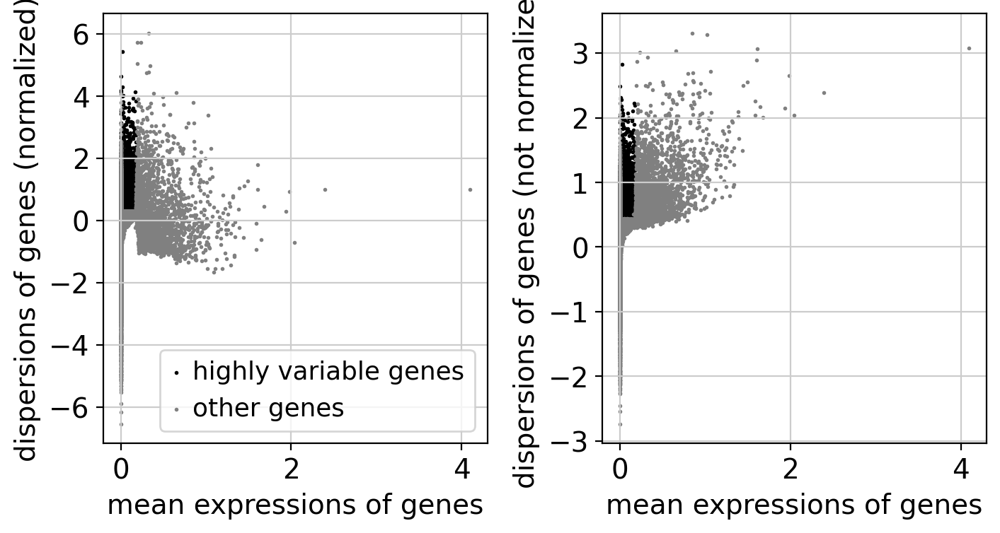

Found 6830 variables genes of 32767 total


In [85]:
sc.pp.highly_variable_genes(adata, min_mean=0.0015, max_mean=0.18, min_disp=0.30, batch_key='batch') # good
sc.pl.highly_variable_genes(adata, log=False)
print('Found %i variables genes of %i total' %(sum(adata.var['highly_variable']), adata.var.shape[0] ) )

/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


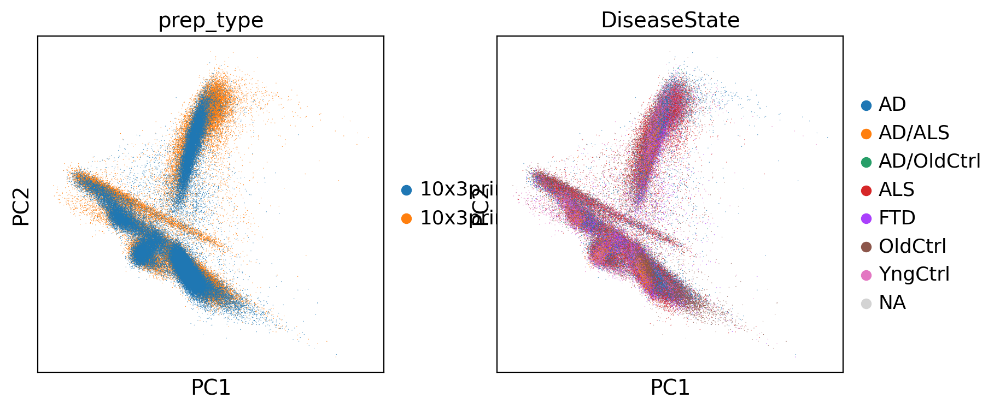

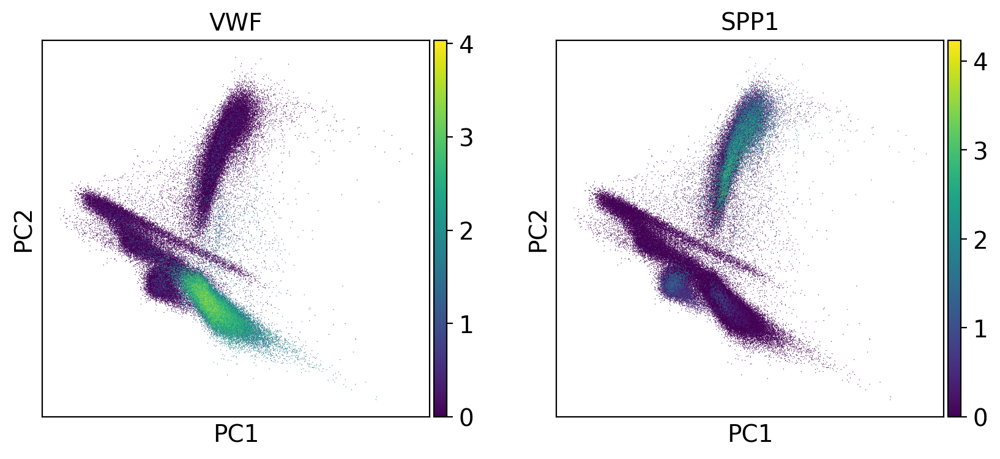

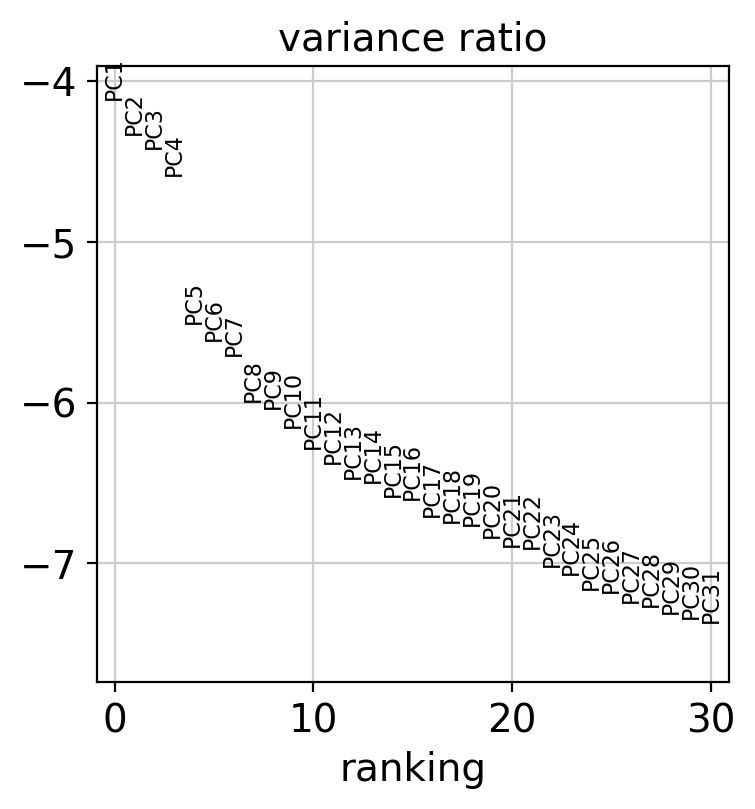

In [147]:
sc.pl.pca(adata, color=['prep_type','DiseaseState'])
sc.pl.pca(adata, color=['VWF','SPP1'])
sc.pl.pca_variance_ratio(adata, log=True)

# Harmony

In [148]:
#!pip install harmony-pytorch

In [149]:
from harmony import harmonize

In [150]:
adata.obsm['X_harmony'] = harmonize(np.array(adata.obsm['X_pca']), 
                                    adata.obs, batch_key = ['batch','SampleID'])

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
Reach convergence after 7 iteration(s).


In [151]:
sc.pp.neighbors(adata, use_rep='X_harmony', n_neighbors=10, n_pcs=40)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:16)


In [152]:
sc.tl.umap(adata)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:25)


In [153]:
sc.tl.leiden(adata, resolution=0.8)

running Leiden clustering
    finished: found 27 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:59)


In [155]:
adata.obs.Demux2_plus_demuxem_assignment.value_counts()

Demux2_plus_demuxem_assignment
NuclearPoreHash7    38358
NuclearPoreHash8    38107
NuclearPoreHash3    35991
NuclearPoreHash1    34202
NuclearPoreHash2     4927
Name: count, dtype: int64

In [156]:
condition = (adata.obs['date'] == 'Jan19B_2023') & (adata.obs['Demux2_plus_demuxem_assignment'] == 'NuclearPoreHash2')
condition.value_counts()

False    149862
True       1723
Name: count, dtype: int64

In [157]:
adata = adata[~condition] #ambiguous assignment from previous processing
adata = adata[~adata.obs['DiseaseState'].isin(['AD/OldCtrl', 'AD/ALS'])] #combined samples

In [159]:
sc.tl.umap(adata, min_dist=0.4)
sc.tl.leiden(adata, resolution=0.8)

computing UMAP


/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/scanpy/tools/_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:17)
running Leiden clustering
    finished: found 24 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:03)


Preprocessing...


/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/scrublet/helper_functions.py:251: RuntimeWarning: invalid value encountered in sqrt
  CV_eff = np.sqrt((1+a)*(1+b) - 1);


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.35
Detected doublet rate = 3.3%
Estimated detectable doublet fraction = 61.3%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 5.4%
Elapsed time: 9.8 seconds
Detected doublet rate = 6.2%
Estimated detectable doublet fraction = 74.6%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 8.3%
432 doublets found for batch Dec22_2022
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.56
Detected doublet rate = 0.6%
Estimated detectable doublet fraction = 39.7%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.4%
Elapsed time: 2.0 seconds
Detected doublet rate = 8.7%
Estimated detectable doublet fraction = 74.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 11.8%
313 doublets found for batch Feb2_2022
Preprocessing...
Simu

146 doublets found for batch Mar15_2022
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.43
Detected doublet rate = 1.5%
Estimated detectable doublet fraction = 52.3%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 2.9%
Elapsed time: 2.2 seconds
Detected doublet rate = 7.6%
Estimated detectable doublet fraction = 69.9%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 10.9%
273 doublets found for batch Mar16A_2022
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.48
Detected doublet rate = 0.9%
Estimated detectable doublet fraction = 58.4%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.5%
Elapsed time: 3.5 seconds
Detected doublet rate = 3.0%
Estimated detectable doublet fraction = 74.3%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 4.0%
14

/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/scrublet/scrublet.py:485: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2, figsize = fig_size)


456 doublets found for batch Mar21_2022
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.39
Detected doublet rate = 2.3%
Estimated detectable doublet fraction = 64.8%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 3.5%
Elapsed time: 5.0 seconds
Detected doublet rate = 4.0%
Estimated detectable doublet fraction = 75.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 5.3%
220 doublets found for batch Mar24A_2022
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.34
Detected doublet rate = 2.7%
Estimated detectable doublet fraction = 69.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 3.8%
Elapsed time: 7.2 seconds
Detected doublet rate = 3.0%
Estimated detectable doublet fraction = 70.6%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 4.2%
230

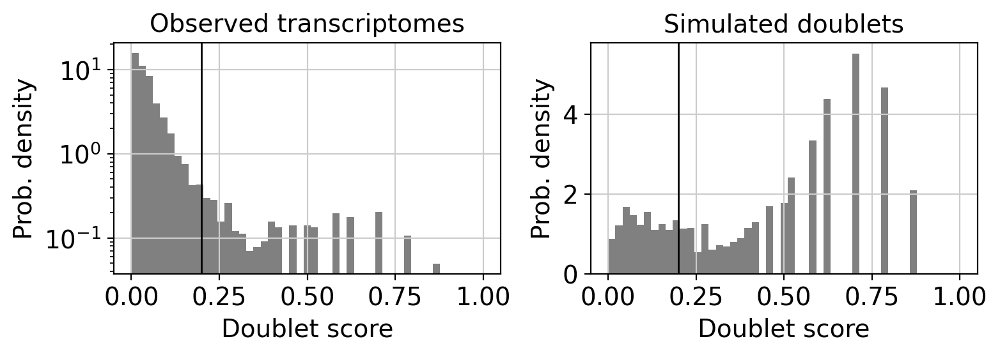

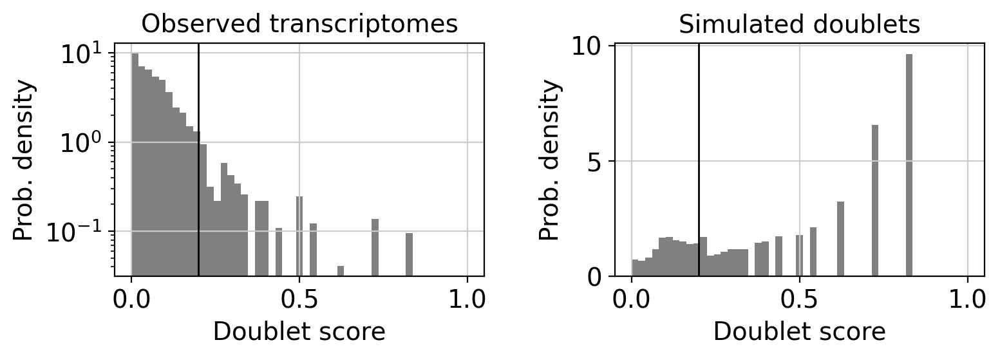

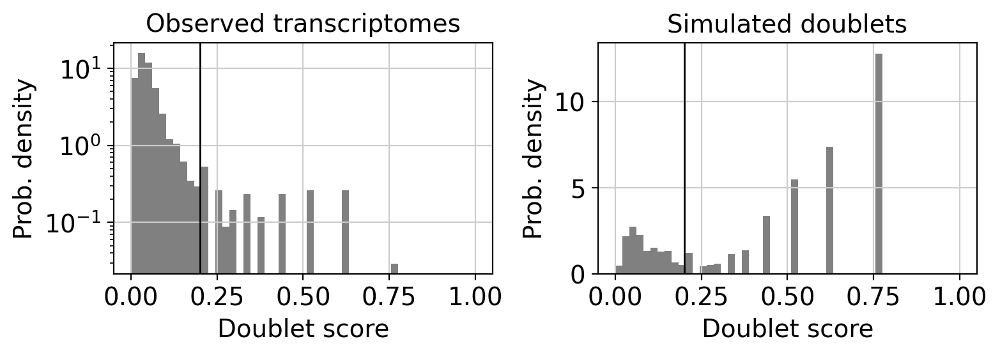

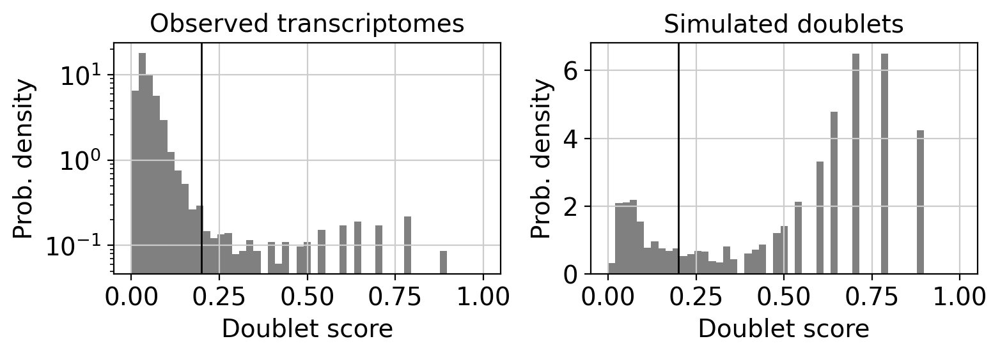

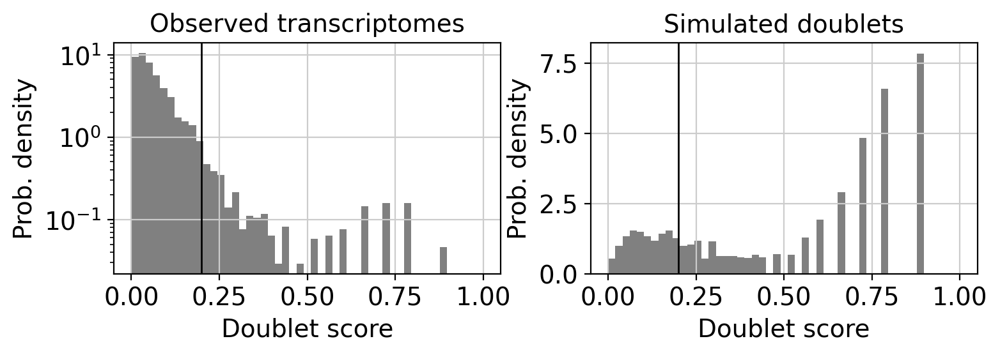

...

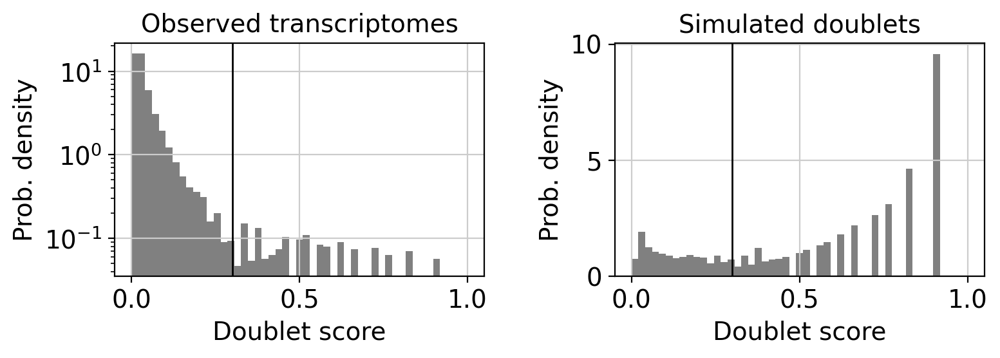

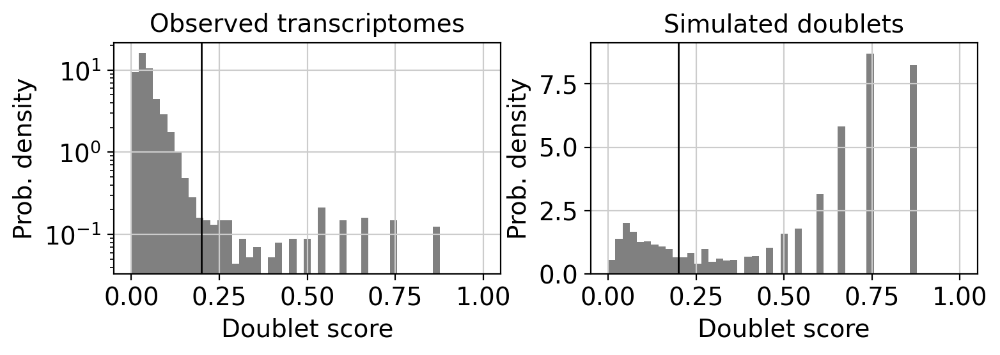

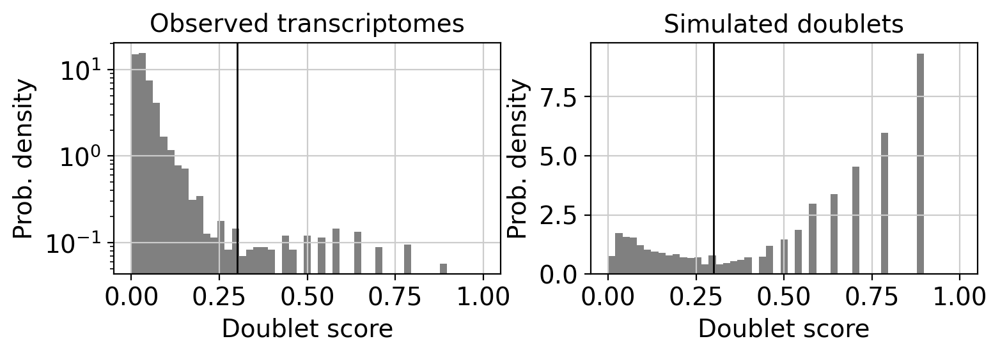

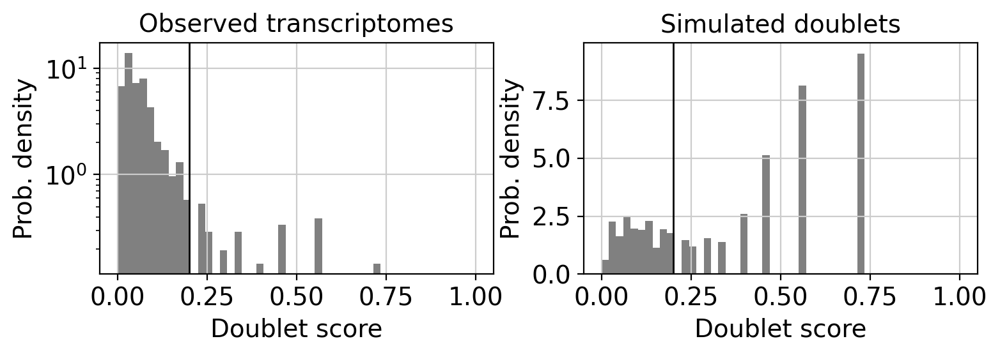

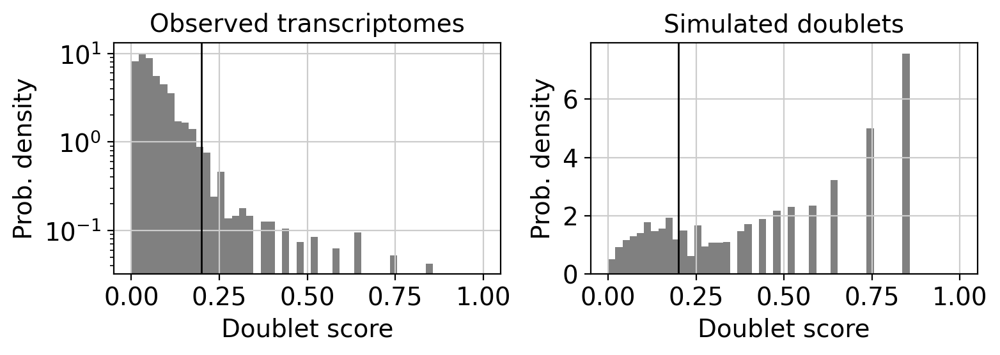

In [164]:
#scrublet
# identify doublets -- calculated by batch
adata.obs['doublet'] = False
adata.obs['doublet_scores'] = 0


THRESH={'Dec22_2022':0.2,
        'Feb2_2022':0.2,
        'Jan9_2023':0.2,
        'Jan11_2023':0.2,
        'Jan12_2023':0.2,
        'Jan17_2023':0.2,
        'Jan18_2023':0.2,
        'Jan19A_2023':0.2,
        'Jan19B_2023':0.2,
        'Jan24A_2023':0.2,
        'Jan24B_2023':0.2,
        'Jan25_2023':0.2,
        'Mar2A_2022':0.2,
        'Mar2B_2022':0.2,
        'Mar8_2022':0.2,
        'Mar9A_2022':0.2,
        'Mar9B_2022':0.2,
        'Mar15_2022':0.2,
        'Mar16A_2022':0.2,
        'Mar16B_2022':0.2,
        'Mar17_2022':0.2,
        'Mar21_2022':0.3,
        'Mar24A_2022':0.2,
        'Mar24B_2022':0.3,
        'Oct10_2022':0.2,
        'Oct19_2022':0.2,
        }

for batch in adata.obs.date.cat.categories: 
    batch_thresh = THRESH[batch]
    counts_matrix = adata[adata.obs['date']==batch].layers['counts']
    
    scrub = scr.Scrublet(counts_matrix, expected_doublet_rate=0.1)
    doublet_scores, predicted_doublets = scrub.scrub_doublets(min_counts=5, 
                                                              min_cells=5, 
                                                              min_gene_variability_pctl=80,
                                                              n_prin_comps=30)
    
    scrub.call_doublets(threshold=batch_thresh)
    scrub.plot_histogram();
    print('%i doublets found for batch %s' %(sum(doublet_scores>batch_thresh), batch) )

    adata.obs.loc[adata.obs['date']==batch, 'doublet'] = doublet_scores>batch_thresh
    adata.obs.loc[adata.obs['date']==batch, 'doublet_scores'] = doublet_scores

/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


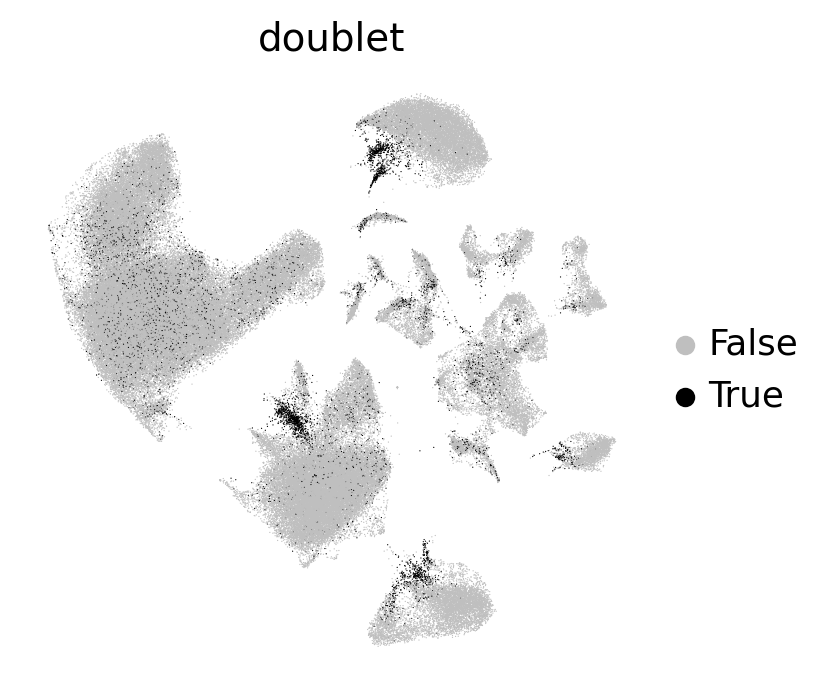

Total 7169 doublets


In [165]:
# plot doublets 0.1
adata.obs['doublet'] = adata.obs['doublet'].astype('category')
sc.pl.umap(adata, color=['doublet'], palette=['#bfbfbf','#000000'], frameon=False)

print('Total %i doublets' %sum(adata.obs['doublet']))

In [166]:
adata = adata[adata.obs['doublet']==False]
print(adata.shape)

(142693, 32767)


In [170]:
#!pip install harmony-pytorch

In [171]:
from harmony import harmonize

In [172]:
adata.obsm['X_harmony'] = harmonize(np.array(adata.obsm['X_pca']), 
                                    adata.obs, batch_key = ['SampleID'])

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
Reach convergence after 9 iteration(s).


In [173]:
sc.pp.neighbors(adata, use_rep='X_harmony', n_neighbors=10, n_pcs=40)
sc.tl.umap(adata, min_dist=0.4)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:15)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:13)


In [174]:
sc.tl.leiden(adata, resolution=0.8)

running Leiden clustering
    finished: found 29 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:36)


In [ ]:
#annotate with pegasus 

In [183]:
# Retry the differential expression analysis
#23 min
import pegasus as pg
pg.de_analysis(adata, cluster='leiden')

2023-08-11 14:05:28,239 - pegasus.tools.diff_expr - INFO - CSR matrix is converted to CSC matrix. Time spent = 160.7886s.


/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-objec

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mod

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fal

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fal

/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/py

/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/FCAM/oomar/miniconda3/envs/pat_sierra_

/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/FCAM/oomar/miniconda3/envs/pat_sierra_

/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/python3.11/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/FCAM/oomar/miniconda3/envs/pat_sierra_env/lib/py

calc_mwu finished for genes in [683, 1366).
calc_mwu finished for genes in [1366, 2049).
calc_mwu finished for genes in [2732, 3415).
calc_mwu finished for genes in [2049, 2732).
calc_mwu finished for genes in [6147, 6830).
calc_mwu finished for genes in [5464, 6147).
calc_mwu finished for genes in [4781, 5464).
calc_mwu finished for genes in [3415, 4098).
calc_mwu finished for genes in [4098, 4781).
calc_mwu finished for genes in [8196, 8879).
calc_mwu finished for genes in [9562, 10245).
calc_mwu finished for genes in [8879, 9562).
calc_mwu finished for genes in [7513, 8196).
calc_mwu finished for genes in [6830, 7513).
2023-08-11 14:27:13,365 - pegasus.tools.diff_expr - INFO - MWU test and AUROC calculation are finished. Time spent = 1305.1256s.
2023-08-11 14:27:32,593 - pegasus.tools.diff_expr - INFO - Sufficient statistics are collected. Time spent = 19.2281s.
2023-08-11 14:28:32,954 - pegasus.tools.diff_expr - INFO - Differential expression analysis is finished.
2023-08-11 14:28:

In [185]:
celltype_dict = pg.infer_cell_types(adata, markers = 'human_brain')
cluster_names = pg.infer_cluster_names(celltype_dict)

calc_mwu finished for genes in [12977, 13660).
calc_mwu finished for genes in [11611, 12294).
calc_mwu finished for genes in [12294, 12977).
calc_mwu finished for genes in [10245, 10928).


In [186]:
pg.annotate(adata, name='anno', based_on='leiden', anno_dict=cluster_names)
adata.obs['anno'].value_counts()

anno
Endothelial               26756
Microglia                 24044
Endothelial-2             16616
Endothelial-3             13505
Oligodendrocyte           11116
Endothelial-4              8978
Endothelial-5              6009
Glutamatergic neuron       5848
Astrocyte                  5597
OPC                        3954
Mural                      2492
Glutamatergic neuron-2     1945
GABAergic neuron           1936
OPC-2                      1914
GABAergic neuron-2         1573
Mural-2                    1465
Microglia-2                1098
Glutamatergic neuron-3     1051
Mural-3                     916
Glutamatergic neuron-4      674
Microglia-3                 647
Microglia-4                 344
Endothelial-6               248
Microglia-5                 201
Glutamatergic neuron-5      162
Microglia-6                 146
Endothelial-7                80
Microglia-7                  19
28                            8
Name: count, dtype: int64

In [ ]:
##################Excluded samples####################

In [25]:
#remove low quality samples and samples with unclear or confounding neuropath diagnosis/poor quality samples
adata.obs.loc[adata.obs['SampleID'] == '4976', 'DiseaseState'] = 'AD' #actually has AD from medical record

adata = adata[~adata.obs["SampleID"].isin(["1103"])]#Yng 1103 had hypercholesterolemia
adata = adata[~adata.obs["SampleID"].isin(["1233"])] #ALS 1233: neuropath says not ALS (everything is normal);
adata = adata[~adata.obs["SampleID"].isin(["1946"])] #1946 pure lewy body dementia

filtered = adata[~adata.obs["SampleID"].isin(["5077","4906","5854"])]#poor quality CITE-ab staining

In [26]:
filtered=filtered[~filtered.obs.SampleID.isin(['5854'])]#poor quality CITE-ab aggregates
filtered=filtered[~filtered.obs.SampleID.isin(['1233'])]#poor quality CITE-ab aggregates